In [16]:
from functions import *

### Plot data from XPS .txt file from Avantage

remember: you need to export ”peak BE", "FWHM", "Area", “Height”, "Atomic %" 

In [17]:

folder = r"Z:\P110143-phosphosulfides-Andrea\Data\Samples\mittma_0022_Cu\XPS"

sample = "mittma_0022_FL_core"
filename = sample + ".txt"
filename = os.path.join(folder, filename)

grid= measurement_grid(9,9,32,32,-16,-16) 

initial_data,coords = read_XPS(filename, grid)

Coordinate -16.0,16.0                                            \
Data type        Peak Peak BE (eV) Intensity (counts) FWHM (eV)   
0                Cu2p      952.616         1362.79392     1.963   
1                Cu2p      932.779         3961.52272      1.31   
2               Sb3d3      538.746             61.251     1.137   
3                 O1s      532.568           68.35224     2.857   
4                 C1s      285.796           47.44332     1.714   
5                 C1s      284.701          271.71876      1.35   
6                S2p3       161.91          783.20752     0.947   
7                P2p3      129.148          101.42804     0.788   

Coordinate                                                             \
Data type  Area (counts*eV) Atomic % Cu2p Total Sb3d3 Total O1s Total   
0                 778179.58   18.335     53.203       0.206     3.243   
1               1518642.957   34.868        NaN         NaN       NaN   
2                  8159.951    0.206        NaN         NaN       NaN   
3                 22873.865    3.243        NaN         NaN       NaN   
4                  9506.781    3.258        NaN         NaN       NaN   
5                 42846.126   14.673        NaN         NaN       NaN   
6                 86892.174   22.173        NaN         NaN       NaN   
7                  9323.553    3.245        NaN         NaN       NaN   

Coordinate            ...         16.0,-16.0                             \
Data type  C1s Total  ... Intensity (counts) FWHM (eV) Area (counts*eV)   
0             17.931  ...         1438.69588     1.988       831612.491   
1                NaN  ...         4130.15468     1.347      1628249.867   
2                NaN  ...           57.37236     1.297         8716.359   
3                NaN  ...           73.99868     2.673        23186.134   
4                NaN  ...           48.38104     1.645         9303.087   
5                NaN  ...          223.06776     1.383        35984.567   
6                NaN  ...           707.1582     0.963         79744.31   
7                NaN  ...          153.57288       0.8        14359.445   

Coordinate                                                                 \
Data type  Atomic % Cu2p Total Sb3d3 Total O1s Total C1s Total S2p3 Total   
0            19.335     56.225       0.217     3.243    15.304     20.079   
1             36.89        NaN         NaN       NaN       NaN        NaN   
2             0.217        NaN         NaN       NaN       NaN        NaN   
3             3.243        NaN         NaN       NaN       NaN        NaN   
4             3.145        NaN         NaN       NaN       NaN        NaN   
5            12.159        NaN         NaN       NaN       NaN        NaN   
6            20.079        NaN         NaN       NaN       NaN        NaN   
7             4.932        NaN         NaN       NaN       NaN        NaN   

Coordinate             
Data type  P2p3 Total  
0               4.932  
1                 NaN  
2                 NaN  
3                 NaN  
4                 NaN  
5                 NaN  
6                 NaN  
7                 NaN  

[8 rows x 972 columns]

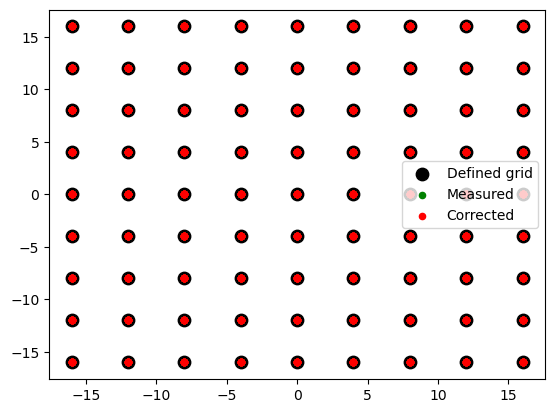

In [18]:
# data = rotate_coordinates(initial_data, how='clockwise') # only for mittma_0019 bacuse it was mounted on the wrong direction (rotate it clockwise to correct)
data = initial_data
coords= MI_to_grid(data)
plot_grid(coords, grid)
display(data)

In [19]:
# data.columns.get_level_values(1).unique()
elements_list=[]
el_list=[]
for type in data.columns.get_level_values(1).unique():
    try:
        if type.split(" ")[1]== 'Total':
            element = type.split(" ")[0] 
            elements_list.append(element)
            try:
                # print(element.split()[0][0])
                float(element.split()[0][1]) #if there is a number in position 1 
                el= element.split()[0][0]
                el_list.append(el)
            except:
                el=element.split()[0][0]+ element.split()[0][1]
                el_list.append(el)
    except IndexError:
        pass
print(elements_list)
print(el_list)


['Cu2p', 'Sb3d3', 'O1s', 'C1s', 'S2p3', 'P2p3']
['Cu', 'Sb', 'O', 'C', 'S', 'P']


In [20]:
os.makedirs(os.path.join(folder, 'plots'), exist_ok=True) # check if a 'plots' folder exists, if not create it
for i in range(len(elements_list)):
    el = elements_list[i]
    element = el_list[i]
    print(el)
    savepath = os.path.join(folder, 'plots', f'{sample}_{el}.png')
    new_heatmap(datatype= f'{el} Total', data=data, title = f'{sample} {element} atomic %', cbar= f'{element} %',
                 exclude=['4.0,16.0'],  # if you want to exclude some point
                # savepath= savepath # if you want to save the plots
                )

Cu2p


Sb3d3


O1s


C1s


S2p3


P2p3


#### plot other quantities

In [ ]:
#calculate ratios
data_ratios= math_on_columns(data, 'P2p3 Total', 'S2p3 Total', '/')
data_ratios.rename(columns={'P2p3 Total / S2p3 Total': 'P_S_ratio'}, level=1, inplace=True)
data_ratios= math_on_columns(data_ratios, 'P2p3 Total', 'S2p3 Total', '+')
data_ratios= math_on_columns(data_ratios, 'Cu2p Total', 'P2p3 Total + S2p3 Total' , '/')
data_ratios.rename(columns={'Cu2p Total / P2p3 Total + S2p3 Total': 'Cu_anions_ratio'}, level=1, inplace=True)
data_ratios= math_on_columns(data_ratios, 'Cu2p Total', 'P2p3 Total' , '/')
data_ratios.rename(columns={'Cu2p Total / P2p3 Total': 'Cu_P_ratio'}, level=1, inplace=True)
data_ratios= math_on_columns(data_ratios, 'Cu2p Total', 'S2p3 Total' , '/')
data_ratios.rename(columns={'Cu2p Total / S2p3 Total': 'Cu_S_ratio'}, level=1, inplace=True)

display(data_ratios)

In [ ]:
#plot ratios
os.makedirs(os.path.join(folder, 'plots'), exist_ok=True) # check if a 'plots' folder exists, if not create it
ratios= ['P_S_ratio', 'Cu_anions_ratio', 'Cu_P_ratio', 'Cu_S_ratio']
# ratios= ['P', 'S', 'Cu']

for i in range(len(ratios)):
    ratio = ratios[i]
    num = ratio.split('_')[0]
    den= ratio.split('_')[1]
    savepath = os.path.join(folder, 'plots', f'{sample}_{ratio}.png')
    new_heatmap(datatype= ratio, data=data_ratios, title = f'{sample} {ratio}', cbar= f'{num}/{den}',
                 exclude=['4.0,16.0'], #,'16.0,16.0'],  # if you want to exclude some point, write the point 'x.0,y.0' no spaces, 1 decimal
                savepath= savepath # if you want to save the plots
                )

In [61]:
# calculate totals
data_norm= math_on_columns(data, 'P2p3 Total', 'S2p3 Total', '+')
data_norm= math_on_columns(data_norm, 'P2p3 Total + S2p3 Total', 'Cu2p Total', '+')
data_norm.drop(columns=['P2p3 Total + S2p3 Total'], level=1, inplace=True)
data_norm.rename(columns={'P2p3 Total + S2p3 Total + Cu2p Total': 'Total'}, level=1, inplace=True)

data_norm= math_on_columns(data_norm, 'P2p3 Total' , 'Total', '/')
data_norm = math_on_columns(data_norm, 'P2p3 Total / Total', 100, '*')
data_norm.rename(columns={'P2p3 Total / Total * 100': 'P'}, level=1, inplace=True)
data_norm.drop(columns=['P2p3 Total / Total'], level=1, inplace=True)

data_norm= math_on_columns(data_norm, 'S2p3 Total' , 'Total', '/')
data_norm = math_on_columns(data_norm, 'S2p3 Total / Total', 100, '*')
data_norm.rename(columns={'S2p3 Total / Total * 100': 'S'}, level=1, inplace=True)
data_norm.drop(columns=['S2p3 Total / Total'], level=1, inplace=True)

data_norm= math_on_columns(data_norm, 'Cu2p Total' , 'Total', '/')
data_norm = math_on_columns(data_norm, 'Cu2p Total / Total', 100, '*')
data_norm.rename(columns={'Cu2p Total / Total * 100': 'Cu'}, level=1, inplace=True)
data_norm.drop(columns=['Cu2p Total / Total'], level=1, inplace=True)


display(data_norm)

pkl_path= r"Z:\P110143-phosphosulfides-Andrea\Data\Analysis\guidal\XPS"
pkl_name= f'{sample}_all_normalized.pkl'
data_norm.to_pickle(os.path.join(pkl_path, pkl_name))



16.0,16.0                                                             \
       Peak Peak BE (eV) Intensity (counts) FWHM (eV) Area (counts*eV)   
0      Cu2p      952.528          738.95688     1.727       371216.986   
1      Cu2p       932.72         2196.25884     1.204       773983.588   
2       O1s      532.574           17.00424     1.895         3710.943   
3       C1s      285.611            19.9072     2.217         5118.062   
4       C1s       284.31          149.69984     1.191         20857.79   
5      S2p3      162.029          609.10872     1.021        72812.736   
6      P2p3      131.938           40.72764     0.779         3704.974   

                                                      ... -16.0,-0.0  \
  Atomic % Cu2p Total O1s Total C1s Total S2p3 Total  ...   Atomic %   
0    15.67     47.509     0.943    15.938     33.295  ...      11.37   
1   31.839        NaN       NaN       NaN        NaN  ...     23.379   
2    0.943        NaN       NaN       NaN        NaN  ...      1.999   
3    3.142        NaN       NaN       NaN        NaN  ...      5.158   
4   12.796        NaN       NaN       NaN        NaN  ...       12.4   
5   33.295        NaN       NaN       NaN        NaN  ...      42.03   
6    2.315        NaN       NaN       NaN        NaN  ...      3.664   

                                                                          \
  Cu2p Total O1s Total C1s Total S2p3 Total P2p3 Total   Total         P   
0     34.749     1.999    17.558      42.03      3.664  80.443  4.554778   
1        NaN       NaN       NaN        NaN        NaN     NaN       NaN   
2        NaN       NaN       NaN        NaN        NaN     NaN       NaN   
3        NaN       NaN       NaN        NaN        NaN     NaN       NaN   
4        NaN       NaN       NaN        NaN        NaN     NaN       NaN   
5        NaN       NaN       NaN        NaN        NaN     NaN       NaN   
6        NaN       NaN       NaN        NaN        NaN     NaN       NaN   

                         
           S         Cu  
0  52.248176  43.197046  
1        NaN        NaN  
2        NaN        NaN  
3        NaN        NaN  
4        NaN        NaN  
5        NaN        NaN  
6        NaN        NaN  

[7 rows x 1155 columns]

In [65]:
# make a smaller df to export as pickle

data_light= data_norm.copy()
cols= data_light.columns.get_level_values(1).unique()
display(len(data_norm.columns.get_level_values(1).unique()))
data_light.drop(columns=cols[0:12], level=1, inplace=True) # check if you are cutting too much
data_light.dropna(axis=0, how='all', inplace=True)


data_light, coords= translate_data(data_light, -20,-20)
display(data_light)

pkl_name= f'{sample}_light_normalized.pkl'
data_light.to_pickle(os.path.join(pkl_path, pkl_name))

15

Coordinate -4.0,-4.0                      -4.0,-8.0                      \
Data type          P          S        Cu         P          S       Cu   
0           2.785163  40.057027  57.15781  2.732866  40.300234  56.9669   

Coordinate -4.0,-12.0                       -4.0,-16.0  ... -36.0,-8.0  \
Data type           P          S         Cu          P  ...         Cu   
0            2.838347  40.203181  56.958472   2.849559  ...  44.474285   

Coordinate -36.0,-12.0                       -36.0,-16.0             \
Data type            P          S         Cu           P          S   
0             4.824732  51.424403  43.750865    4.821112  51.600379   

Coordinate            -36.0,-20.0                        
Data type          Cu           P          S         Cu  
0           43.578508    4.554778  52.248176  43.197046  

[1 rows x 231 columns]

In [64]:
os.makedirs(os.path.join(folder, 'plots'), exist_ok=True) # check if a 'plots' folder exists, if not create it
ratios= ['P', 'S', 'Cu']

for i in range(len(ratios)):
    ratio = ratios[i]
    savepath = os.path.join(folder, 'plots', f'{sample}_{ratio}_norm.png')
    new_heatmap(datatype= ratio, data=data_norm, title = f'{sample} {ratio}',# cbar= f'{num}/{den}',
                #  exclude=['4.0,16.0'], #,'16.0,16.0'],  # if you want to exclude some point, write the point 'x.0,y.0' no spaces, 1 decimal
                savepath= savepath # if you want to save the plots
                )

#### plot peak BE and Area counts, from non quant file

In [60]:
display(data)

Coordinate -16.0,16.0                                            \
Data type        Peak Peak BE (eV) Intensity (counts) FWHM (eV)   
0                P2p3      129.175          336.33212     0.823   
1                P2p1      130.075           171.7894     0.823   
2                S2p3      161.872          171.71312     1.192   
3                S2p1      162.972           87.71296      1.19   
4                 C1s      284.688          226.95816     1.531   
5                 C1s      286.165            37.5812       2.4   
6               Sb3d5       530.35           295.0048     2.006   
7                 O1s      532.703          286.37804     1.671   
8               Sb3d3       539.55          204.46016     2.006   
9                  Cu      566.479          475.42604     1.788   
10                 Cu      569.032         1717.37572     1.961   
11                 Cu      571.902          302.81596     3.529   
12               Cu2p      933.089          3081.7326     1.462   
13               Cu2p      952.888         1075.79316     1.996   

Coordinate                                                             \
Data type  Area (counts*eV) Atomic % P2p3 Total P2p1 Total S2p3 Total   
0                 32368.262    8.639      8.639      8.643      4.685   
1                 16532.839    8.643        NaN        NaN        NaN   
2                  23947.03    4.685        NaN        NaN        NaN   
3                 12232.407    4.688        NaN        NaN        NaN   
4                 40737.645   10.697        NaN        NaN        NaN   
5                 10474.406    2.753        NaN        NaN        NaN   
6                 69265.273    0.921        NaN        NaN        NaN   
7                  56084.23    6.097        NaN        NaN        NaN   
8                 48033.499    0.929        NaN        NaN        NaN   
9                 99730.154    2.796        NaN        NaN        NaN   
10                394774.64   11.092        NaN        NaN        NaN   
11               124244.047    3.499        NaN        NaN        NaN   
12              1320650.734   23.258        NaN        NaN        NaN   
13               625417.389   11.302        NaN        NaN        NaN   

Coordinate             ... 16.0,-16.0                                   \
Data type  S2p1 Total  ... P2p3 Total P2p1 Total S2p3 Total S2p1 Total   
0               4.688  ...      7.948      7.952      5.017       5.02   
1                 NaN  ...        NaN        NaN        NaN        NaN   
2                 NaN  ...        NaN        NaN        NaN        NaN   
3                 NaN  ...        NaN        NaN        NaN        NaN   
4                 NaN  ...        NaN        NaN        NaN        NaN   
5                 NaN  ...        NaN        NaN        NaN        NaN   
6                 NaN  ...        NaN        NaN        NaN        NaN   
7                 NaN  ...        NaN        NaN        NaN        NaN   
8                 NaN  ...        NaN        NaN        NaN        NaN   
9                 NaN  ...        NaN        NaN        NaN        NaN   
10                NaN  ...        NaN        NaN        NaN        NaN   
11                NaN  ...        NaN        NaN        NaN        NaN   
12                NaN  ...        NaN        NaN        NaN        NaN   
13                NaN  ...        NaN        NaN        NaN        NaN   

Coordinate                                                                  
Data type  C1s Total Sb3d5 Total O1s Total Sb3d3 Total Cu Total Cu2p Total  
0             14.089       0.496     7.395       0.501   17.076     34.505  
1                NaN         NaN       NaN         NaN      NaN        NaN  
2                NaN         NaN       NaN         NaN      NaN        NaN  
3                NaN         NaN       NaN         NaN      NaN        NaN  
4                NaN         NaN       NaN         NaN      NaN        NaN  
5                NaN         NaN  

In [65]:
os.makedirs(os.path.join(folder, 'plots','peak_pos_counts'), exist_ok=True) # check if a 'plots' folder exists, if not create it
for i in range(0,14): # check how many rows you df has, +1
    index=i
    datatypes = ['Peak BE (eV)', 'Area (counts*eV)' ]
    cbar_label= data.loc[index, data.columns.get_level_values(1) == 'Peak'].values.flatten()[0]
    for datatype in datatypes:
        savepath = os.path.join(folder, 'plots', 'peak_pos_counts', f'{sample}_{datatype.split(" ")[0]}_{index}_{cbar_label}.png')
        new_heatmap(datatype= datatype, data=data, index= index, title = f'{sample} {cbar_label} {datatype}', cbar= cbar_label,
                     exclude=['0.0,16.0','4.0,16.0', '16.0,16.0'], 
                    savepath= savepath
                    )



## UPS attempt

code is not perfect, requires that you save data line by line in different excels.\\
adjust_BE is used to correct for excels decima error in BE, but cutting data is easier to eliminate errors in intensity.\\

before launching the whole fit, try with test_data, and change the parameters to get a decent fitting ( I am using the background fit to fit the actual onset, then x_intercept is my real onset )

In [74]:
def read_UPS(filename, grid):
    '''"Read data and coordinates from an UPS datafile. The file should be an Excel (.xlsx) file. The data is constrained to a custom grid which must be provided via the "measurement_grid" function."
    Usage: data, coords = read_UPS(filename, grid)"'''
    # load data, energy, and coordinates from all sheets
    dataload_counts = pd.read_excel(filename, sheet_name = None, skiprows = 18)
    dataload_eV = pd.read_excel(filename, sheet_name = None, skiprows = 18, usecols = [0])
    coordload = pd.read_excel(filename, sheet_name = None, skiprows = 13, nrows = 3)

    # select dictionary keys for only usable sheets
    dictlist = list(dataload_eV.keys())

    # remove useless "Titles" sheets that Avantage generates
    # also remove "Peak Table" sheets as we get coordinates from graph sheets
    j = 0
    for i in range(len(dictlist)):
        if dictlist[j].startswith("Titles"):
            del dictlist[j]
            j -= 1
        if dictlist[j].startswith("Peak Table"):
            del dictlist[j]
            j -= 1
        j += 1

    # remove last sheet in file as it should be a blank sheet
    del dictlist[-1]

    data_list = []
    xy_coords_list = []

    # read data
    for i in range(0, len(dictlist)):
        # load data from usable sheets only
        dataselect_counts = dataload_counts[dictlist[i]].dropna(axis = 1, how = 'all')
        data = dataselect_counts.iloc[:,1:]
        data_eV = dataload_eV[dictlist[i]]
        # rename columns
        data.columns.values[:] = "Intensity (counts)"
        # insert energy column besides each data column
        j = 0
        for k in range(0, len(data.columns)):
            data.insert(loc=k+j, column='BE (eV)'.format(k), value=data_eV, allow_duplicates = True)
            j += 1
        data_list.append(data)

        # read coords
        coordselect = coordload[dictlist[i]].dropna(axis=1, how = 'all')
        xcoord = coordselect.iloc[0,1]
        ycoord = coordselect.iloc[2,2:]
        # create coords list
        for l in range(len(ycoord)):
            x = xcoord
            y = ycoord[l]
            xy_coords = np.array([x, y])
            xy_coords_list.append(xy_coords)

    # create coords dataframe
    coords = pd.DataFrame(xy_coords_list, columns=['x', 'y'])

    # create merged data dataframe
    dataframe = pd.concat(data_list, axis = 1)

    # adjust range to center coords on 0,0 instead of upper left corner
    coords['x'] = coords['x'].astype(float)# - max(coords['x'].astype(float))/2
    coords['y'] = coords['y'].astype(float)# - max(coords['y'].astype(float))/2

    # convert coords from µm to mm
    coords = coords/1000

    # return dataframe, coords

    # align data to grid
    coordgrid = coords_to_grid(coords, grid)
    coord_header = grid_to_MIheader(coordgrid)

    # construct XRD dataframe with multiindexing for coordinates
    header = pd.MultiIndex.from_product([coord_header, data.columns.unique()],names=['Coordinate','Data type'])
    data = pd.DataFrame(dataframe.values, columns=header)
    return data


In [87]:
file_path= r"Z:\P110143-phosphosulfides-Andrea\Data\Samples\mittma_0023_Cu\XPS"
sample = 'mittma_0023'
file_list= os.listdir(file_path)
file_list= [f for f in file_list if f.endswith('.xlsx')]
file_list.sort()
print(file_list)

# grid= measurement_grid(9,9,32,32,-16,-16)
grid= measurement_grid(9,9,32,32,0,0)
datas = [pd.DataFrame() for _ in file_list]
for i in range(len(file_list)):
    filename= os.path.join(file_path, file_list[i])
    datas[i]= read_UPS(filename, grid)

    print('loaded ', file_list[i])
    # display(datas[i])
    
# datas[0]= read_UPS(os.path.join(file_path, file_list[0]), grid)
# display(datas[0])


['UPS-0.xlsx', 'UPS-12.xlsx', 'UPS-16.xlsx', 'UPS-20.xlsx', 'UPS-24.xlsx', 'UPS-28.xlsx', 'UPS-32.xlsx', 'UPS-4.xlsx', 'UPS-8.xlsx']


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-0.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-12.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-16.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-20.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-24.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-28.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-32.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



loaded  UPS-4.xlsx
loaded  UPS-8.xlsx


C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\460829048.py:52: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [88]:
data= combine_data(datas)
# display(data)

print(data.columns.get_level_values(0).unique())

data, coords= translate_data(data, -16,-16)
# plot_grid(coords, coords)
display(data.head(10))


Index(['0.0,0.0', '0.0,4.0', '0.0,8.0', '0.0,12.0', '0.0,16.0', '0.0,20.0',
       '0.0,24.0', '0.0,28.0', '0.0,32.0', '12.0,0.0', '12.0,4.0', '12.0,8.0',
       '12.0,12.0', '12.0,16.0', '12.0,20.0', '12.0,24.0', '12.0,28.0',
       '12.0,32.0', '16.0,0.0', '16.0,4.0', '16.0,8.0', '16.0,12.0',
       '16.0,16.0', '16.0,20.0', '16.0,24.0', '16.0,28.0', '16.0,32.0',
       '20.0,0.0', '20.0,4.0', '20.0,8.0', '20.0,12.0', '20.0,16.0',
       '20.0,20.0', '20.0,24.0', '20.0,28.0', '20.0,32.0', '24.0,0.0',
       '24.0,4.0', '24.0,8.0', '24.0,12.0', '24.0,16.0', '24.0,20.0',
       '24.0,24.0', '24.0,28.0', '24.0,32.0', '28.0,0.0', '28.0,4.0',
       '28.0,8.0', '28.0,12.0', '28.0,16.0', '28.0,20.0', '28.0,24.0',
       '28.0,28.0', '28.0,32.0', '32.0,0.0', '32.0,4.0', '32.0,8.0',
       '32.0,12.0', '32.0,16.0', '32.0,20.0', '32.0,24.0', '32.0,28.0',
       '32.0,32.0', '4.0,0.0', '4.0,4.0', '4.0,8.0', '4.0,12.0', '4.0,16.0',
       '4.0,20.0', '4.0,24.0', '4.0,28.0', '4.0,32.0', '8.0,0.0

Coordinate -16.0,-16.0                    -16.0,-12.0                     \
Data type      BE (eV) Intensity (counts)     BE (eV) Intensity (counts)   
0             190000.0           360000.0    190000.0           385569.0   
1             189500.0           475107.0    189500.0           432902.0   
2             189000.0           475999.0    189000.0           280000.0   
3             188500.0           470000.0    188500.0           355341.0   
4             188000.0           374886.0    188000.0           379545.0   
5             187500.0           394008.0    187500.0           393546.0   
6             187000.0           481334.0    187000.0           478015.0   
7             186500.0           427750.0    186500.0           248894.0   
8             186000.0           506682.0    186000.0           425765.0   
9             185500.0           434235.0    185500.0           467098.0   

Coordinate -16.0,-8.0                    -16.0,-4.0                     \
Data type     BE (eV) Intensity (counts)    BE (eV) Intensity (counts)   
0            190000.0           408894.0   190000.0           328894.0   
1            189500.0           321561.0   189500.0           320000.0   
2            189000.0           403553.0   189000.0           321334.0   
3            188500.0           417788.0   188500.0           323091.0   
4            188000.0           443318.0   188000.0           255576.0   
5            187500.0           378894.0   187500.0           339083.0   
6            187000.0           380228.0   187000.0           434235.0   
7            186500.0           377560.0   186500.0           430228.0   
8            186000.0           425765.0   186000.0           358666.0   
9            185500.0           414235.0   185500.0           368894.0   

Coordinate -16.0,0.0                     ...  -8.0,0.0                     \
Data type    BE (eV) Intensity (counts)  ...   BE (eV) Intensity (counts)   
0           190000.0           358894.0  ...  190000.0           390228.0   
1           189500.0           343091.0  ...  189500.0           413318.0   
2           189000.0           435765.0  ...  189000.0           400462.0   
3           188500.0           459349.0  ...  188500.0           390228.0   
4           188000.0           364235.0  ...  188000.0           366220.0   
5           187500.0           347560.0  ...  187500.0           386682.0   
6           187000.0           359766.0  ...  187000.0           477098.0   
7           186500.0           461340.0  ...  186500.0           384008.0   
8           186000.0           330228.0  ...  186000.0           534659.0   
9           185500.0           401985.0  ...  185500.0           374228.0   

Coordinate  -8.0,4.0                     -8.0,8.0                     \
Data type    BE (eV) Intensity (counts)   BE (eV) Intensity (counts)   
0           190000.0           507977.0  190000.0           370228.0   
1           189500.0           513780.0  189500.0           286675.0   
2           189000.0           333357.0  189000.0           264008.0   
3           188500.0           406447.0  188500.0           500424.0   
4           188000.0           359545.0  188000.0           403357.0   
5           187500.0           296220.0  187500.0           298666.0   
6           187000.0           258015.0  187000.0           470000.0   
7           186500.0           428894.0  186500.0           316220.0   
8           186000.0           401334.0  186000.0           473773.0   
9           185500.0           328666.0  185500.0           360007.0   

Coordinate -8.0,12.0                    -8.0,16.0                     
Data type    BE (eV) Intensity (counts)   BE (eV) Intensity (counts)  
0           190000.0           324008.0  190000.0           344659.0  
1           189500.0           228894.0  189500.0           413129.0  
2           189000.0           493318.0  189000.0           265992.0  
3           188500.0           406682.0  188500.0    

In [89]:
def UPS_fit(data,startvalue, guess_slope=2000,slope_change=1.5,window=1, background_end=None, fit_background = True, withplots = True,plotscale = 'linear'):
    '''Fit UPS data using dataframe input from read_UPS, the data is fitted by finding background and valence bands based on slope, they are both fitted
    Output: dataframe with the background and fit intersection point, as well as the backgrounds intersect with x'''
    column_headers = data.columns.values
    col_BE = column_headers[::2]
    col_counts = column_headers[1::2]
    mod = LinearModel(prefix='reg_')


    UPS_outframe = pd.DataFrame()
    for i in range(0,len(col_BE)):
        x = data[col_BE[i]]
        y = data[col_counts[i]]

        #reversing the data
        x_reversed = x[::-1].values
        y_reversed = y[::-1].values
        #y_reversed = savgol_filter(y[::-1].values, 2, 1)

        #select based on input start value
        xselect = x_reversed[list(range(startvalue,len(x)))]
        yselect = y_reversed[list(range(startvalue,len(y)))]

        #finding the background onset from slope
        k = 1
        slope = None
        while k < len(yselect)-1:
            slope = yselect[k]-yselect[k-window]
            if slope < guess_slope:
                k = k + 1
            else:
                bkg_start = k
                bkg_slope = slope
                k = len(yselect)-1

        #finding the background end from onset point and slope
        xselect1 = xselect[list(range(bkg_start,len(xselect)))]
        yselect1 = yselect[list(range(bkg_start,len(yselect)))]

        k = 25
        slope = None
        while k < 100:
            slope = yselect1[k]-yselect1[k-window]
            if slope < bkg_slope*slope_change:
                k = k + 1          
            else:
                bkg_end = k
                k = 101

        if background_end: 
            bkg_end = np.where(xselect1 == background_end)[0][0]

        #fitting the background with a linear model
        x_bkg = xselect1[list(range(0,bkg_end))]
        y_bkg = yselect1[list(range(0,bkg_end))]    
        out_bkg = mod.fit(y_bkg, x = x_bkg)
        bkg_x_intercept = (-out_bkg.params['reg_intercept'].value/out_bkg.params['reg_slope'].value)
        
        if fit_background == True:
            #finding the valence onset

            xselect_valence = x_reversed[list(range(bkg_end+bkg_start+startvalue,len(x)))]
            yselect_valence = y_reversed[list(range(bkg_end+bkg_start+startvalue,len(y)))]

            k = 5
            slope = None
            while k < len(yselect_valence)-1:
                slope = yselect_valence[k]-yselect_valence[k-1]
                if slope < bkg_slope*4:
                    k = k + 1
                else:
                    valence_start = k
                    valence_slope = slope
                    k = len(yselect_valence)-1

            #finding valence end
            xselect_valence1 = xselect_valence[list(range(valence_start,len(xselect_valence)))]
            yselect_valence1 = yselect_valence[list(range(valence_start,len(yselect_valence)))]

            k = 15
            slope = None
            while k < len(yselect_valence1)-1:
                slope = yselect_valence1[k]-yselect_valence1[k-1]
                if slope < valence_slope*1.2:
                    k = k + 1     
                    valence_end = len(yselect_valence1)-2
                else:
                    valence_end = k -1
                    k = len(yselect_valence1)
            try:
                x_valence = xselect_valence1[list(range(0,valence_end))]
                y_valence = yselect_valence1[list(range(0,valence_end))]
                out_valence = mod.fit(y_valence, x = x_valence)
                fits_intercept = ((out_valence.params['reg_intercept'].value-out_bkg.params['reg_intercept'].value)/(out_bkg.params['reg_slope'].value-out_valence.params['reg_slope'].value))

            except:
                print('No valence band found')
                out_valence = None
                


            if withplots == 1:
                plt.plot(x,y, label = 'data')
                # try:
                #     plt.plot(x_valence,out_valence.best_fit, label = 'valence fit')
                #     plt.plot(xselect_valence[valence_start],yselect_valence[valence_start],'o', label = 'valence_start')
                #     plt.plot(xselect_valence1[valence_end],yselect_valence1[valence_end],'o', label = 'valence_end')
                # except:
                    # pass
                plt.plot(xselect[bkg_start], yselect[bkg_start], 'o',label = 'bkg_start')
                plt.plot(xselect1[bkg_end], yselect1[bkg_end], 'o',label = 'bkg_end')
                plt.plot(x_bkg, out_bkg.best_fit, '--',label='background fit')
                plt.xlabel(col_BE[i][1])
                plt.ylabel(col_counts[i][1])
                plt.title(col_counts[i][0])
                plt.yscale(plotscale)
                plt.xlim(-1, 4)
                # plt.ylim(-1e4,2e6)
                plt.legend()
                plt.show()
                
                try:  
                    print("bkg_x_intercept:\n",bkg_x_intercept)
                    print("fits_intercept:\n",fits_intercept)
                except:
                    fits_intercept = None*len(bkg_x_intercept)

                intercepts = np.vstack((bkg_x_intercept,fits_intercept)).T
                UPS_header = pd.MultiIndex.from_product([[col_BE[i][0]],['bkg_x_intercept','fits_intercept']],names=['Coordinate','Data type'])
                UPS_output = pd.DataFrame(data=intercepts, columns=UPS_header)

            
        else:
            if withplots == 1:
                plt.plot(x,y, label = 'data')
                plt.plot(x_bkg, out_bkg.best_fit, label='valence fit')
                plt.xlabel(col_BE[i][1])
                plt.ylabel(col_counts[i][1])
                plt.title(col_counts[i][0])
                plt.yscale(plotscale)
                plt.xlim(-1, 4)
                # plt.ylim(-1e4,2e6)
                plt.legend()
                plt.show()
                
                print("bkg_x_intercept:\n",bkg_x_intercept)

            UPS_header = pd.MultiIndex.from_product([[col_BE[i][0]],['bkg_x_intercept']],names=['Coordinate','Data type'])
            UPS_output = pd.DataFrame(data=np.array([bkg_x_intercept]), columns=UPS_header)

        UPS_outframe = pd.concat([UPS_outframe, UPS_output], axis = 1)
    return UPS_outframe

In [90]:
data.drop(400, axis=0, inplace=True)
data.drop(list(range(0, 290)), axis=0, inplace=True)
display(data)

Coordinate -16.0,-16.0                    -16.0,-12.0                     \
Data type      BE (eV) Intensity (counts)     BE (eV) Intensity (counts)   
290          450000.00          561563.00   450000.00          760365.00   
291          445000.00          544435.00   445000.00          740283.00   
292          440000.00          534255.00   440000.00          717842.00   
293          435000.00          519132.00   435000.00          701541.00   
294          430000.00          501511.00   430000.00          675471.00   
..                 ...                ...         ...                ...   
395              -0.75            1723.75       -0.75            2388.93   
396              -0.80            1605.38       -0.80            2521.30   
397              -0.85            1931.98       -0.85            2312.48   
398              -0.90            1629.58       -0.90            1997.98   
399              -0.95            1705.76       -0.95            1999.77   

Coordinate -16.0,-8.0                    -16.0,-4.0                     \
Data type     BE (eV) Intensity (counts)    BE (eV) Intensity (counts)   
290         450000.00          772653.00  450000.00          778785.00   
291         445000.00          746518.00  445000.00          760292.00   
292         440000.00          732656.00  440000.00          735296.00   
293         435000.00          705692.00  435000.00          714227.00   
294         430000.00          690163.00  430000.00          692749.00   
..                ...                ...        ...                ...   
395             -0.75            2344.63      -0.75            2201.95   
396             -0.80            2246.71      -0.80            2143.58   
397             -0.85            2416.23      -0.85            2185.28   
398             -0.90            1772.90      -0.90            1950.52   
399             -0.95            1887.07      -0.95            1947.55   

Coordinate  -16.0,0.0                     ...   -8.0,0.0                     \
Data type     BE (eV) Intensity (counts)  ...    BE (eV) Intensity (counts)   
290         450000.00          784918.00  ...  450000.00          753929.00   
291         445000.00          764301.00  ...  445000.00          741511.00   
292         440000.00          747469.00  ...  440000.00          708822.00   
293         435000.00          721933.00  ...  435000.00          691962.00   
294         430000.00          696785.00  ...  430000.00          669617.00   
..                ...                ...  ...        ...                ...   
395             -0.75            2353.08  ...      -0.75            2092.05   
396             -0.80            2129.81  ...      -0.80            1976.90   
397             -0.85            2130.69  ...      -0.85            2011.26   
398             -0.90            2135.35  ...      -0.90            2396.53   
399             -0.95            1907.55  ...      -0.95            1558.20   

Coordinate   -8.0,4.0                      -8.0,8.0                     \
Data type     BE (eV) Intensity (counts)    BE (eV) Intensity (counts)   
290         450000.00          770896.00  450000.00          781361.00   
291         445000.00          752486.00  445000.00          761415.00   
292         440000.00          734906.00  440000.00          741015.00   
293         435000.00          713265.00  435000.00          719358.00   
294         430000.00          690099.00  430000.00          698088.00   
..                ...                ...        ...                ...   
395             -0.75            2063.84      -0.75            2128.47   
396             -0.80            2050.89      -0.80            2069.29   
397             -0.85            2162.21      -0.85            1815.34   
398             -0.90            2117.98      -0.90            1784.65   
399             -0.95            1570.46      -0.95            1682.94   

Coordinate  -8.0,12.0                     -8.0,16.0      

In [91]:
def adjust_BE_values(data):
    """
    Adjusts the BE values in the DataFrame.
    If a BE value is higher than 10^4, it divides it by 10^5.
    
    Parameters:
    data (pd.DataFrame): The input DataFrame containing BE values.
    
    Returns:
    pd.DataFrame: The DataFrame with adjusted BE values.
    """
    # Check if the 'BE' column exists in the DataFrame at level 1
    if 'BE (eV)' in data.columns.get_level_values(1):
        # Apply the adjustment to the 'BE' column
        data.loc[:, (slice(None), 'BE (eV)')] = data.loc[:, (slice(None), 'BE (eV)')].applymap(lambda x: x / 10**5 if x > 10**4 else x)
    else:
        print("The DataFrame does not contain a 'BE' column at level 1.")
    
    return data

# Example usage
# Assuming 'data' is your multi-index DataFrame
# data = pd.DataFrame({
#     ('Layer 1', 'BE'): [5000, 15000, 20000, 3000],
#     ('Layer 1', 'Other'): [1, 2, 3, 4]
# })
adjusted_data = adjust_BE_values(data)
print(adjusted_data)

Coordinate -16.0,-16.0                    -16.0,-12.0                     \
Data type      BE (eV) Intensity (counts)     BE (eV) Intensity (counts)   
290               4.50          561563.00        4.50          760365.00   
291               4.45          544435.00        4.45          740283.00   
292               4.40          534255.00        4.40          717842.00   
293               4.35          519132.00        4.35          701541.00   
294               4.30          501511.00        4.30          675471.00   
..                 ...                ...         ...                ...   
395              -0.75            1723.75       -0.75            2388.93   
396              -0.80            1605.38       -0.80            2521.30   
397              -0.85            1931.98       -0.85            2312.48   
398              -0.90            1629.58       -0.90            1997.98   
399              -0.95            1705.76       -0.95            1999.77   

Coordinate 

C:\Users\s222531\AppData\Local\Temp\ipykernel_10756\4076156744.py:15: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



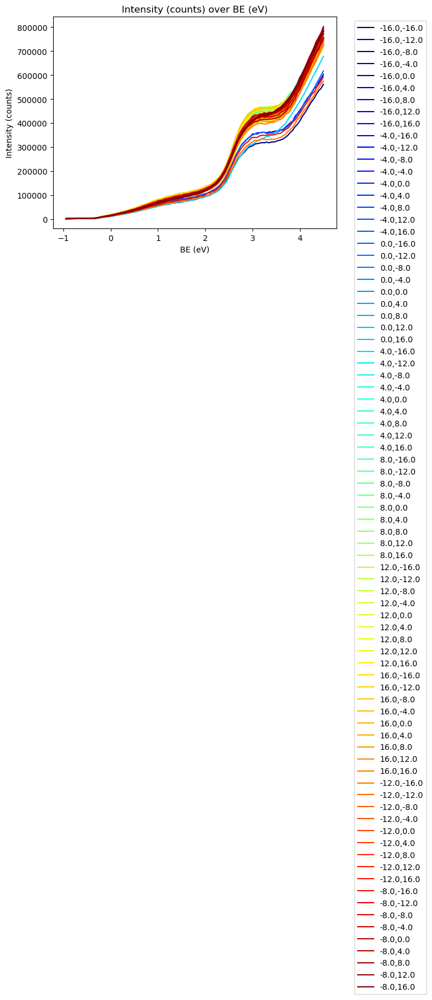

In [92]:
plot_data(adjusted_data, 'BE (eV)', 'Intensity (counts)', plotscale='linear')

In [93]:
test_data= adjusted_data.iloc[:,0:6]
display(test_data)

Coordinate -16.0,-16.0                    -16.0,-12.0                     \
Data type      BE (eV) Intensity (counts)     BE (eV) Intensity (counts)   
290               4.50          561563.00        4.50          760365.00   
291               4.45          544435.00        4.45          740283.00   
292               4.40          534255.00        4.40          717842.00   
293               4.35          519132.00        4.35          701541.00   
294               4.30          501511.00        4.30          675471.00   
..                 ...                ...         ...                ...   
395              -0.75            1723.75       -0.75            2388.93   
396              -0.80            1605.38       -0.80            2521.30   
397              -0.85            1931.98       -0.85            2312.48   
398              -0.90            1629.58       -0.90            1997.98   
399              -0.95            1705.76       -0.95            1999.77   

Coordinate -16.0,-8.0                     
Data type     BE (eV) Intensity (counts)  
290              4.50          772653.00  
291              4.45          746518.00  
292              4.40          732656.00  
293              4.35          705692.00  
294              4.30          690163.00  
..                ...                ...  
395             -0.75            2344.63  
396             -0.80            2246.71  
397             -0.85            2416.23  
398             -0.90            1772.90  
399             -0.95            1887.07  

[110 rows x 6 columns]

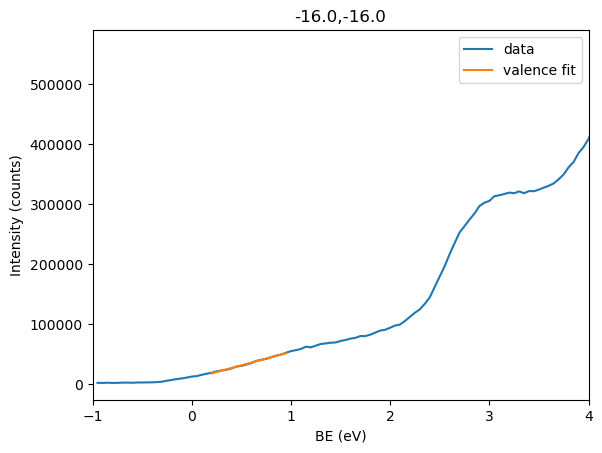

bkg_x_intercept:
 -0.19285988345380406


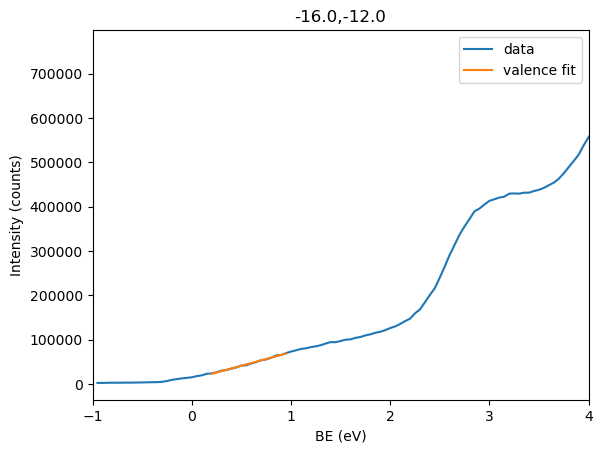

bkg_x_intercept:
 -0.1675074541862926


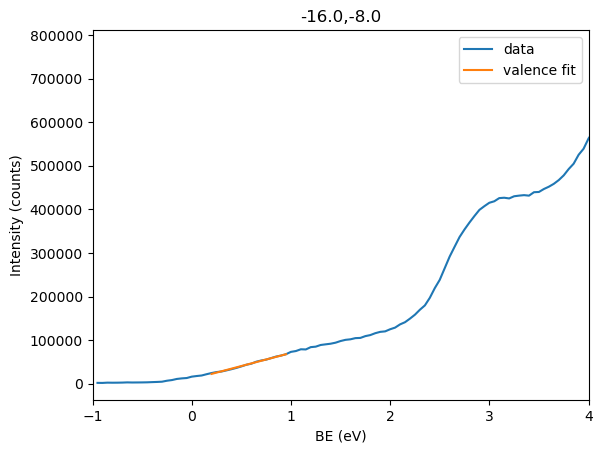

bkg_x_intercept:
 -0.17344054972409603


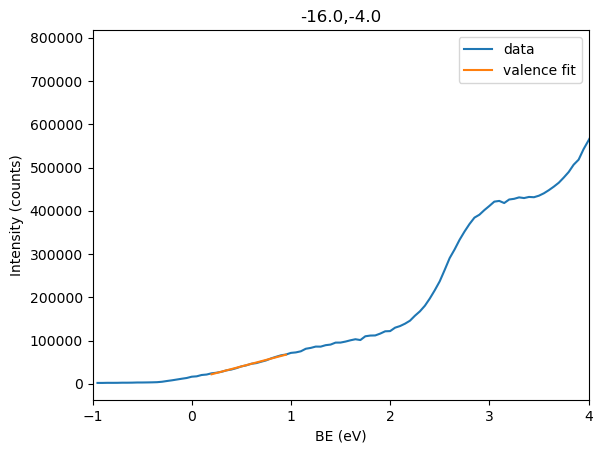

bkg_x_intercept:
 -0.16270879960271792


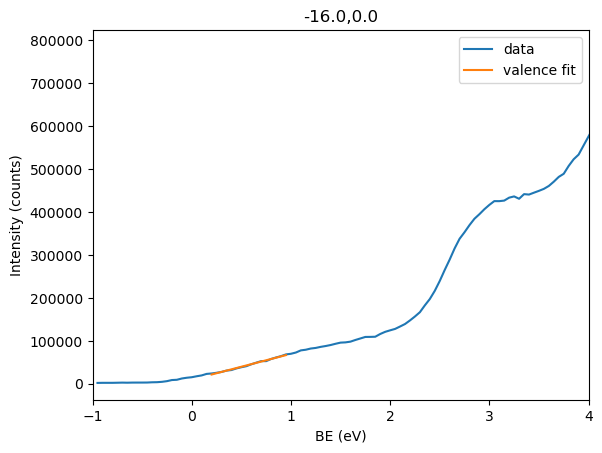

bkg_x_intercept:
 -0.1558992073319008


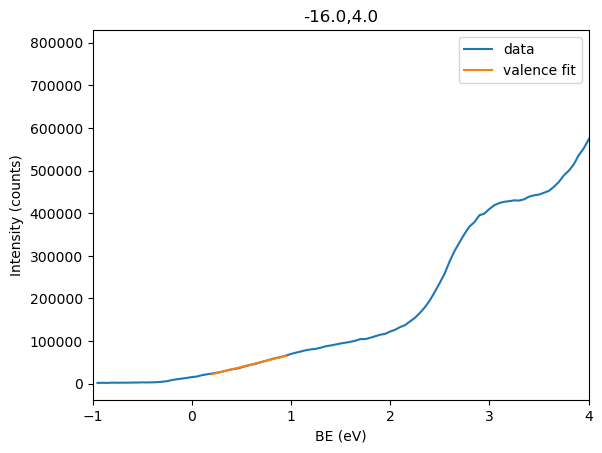

bkg_x_intercept:
 -0.18130512449924366


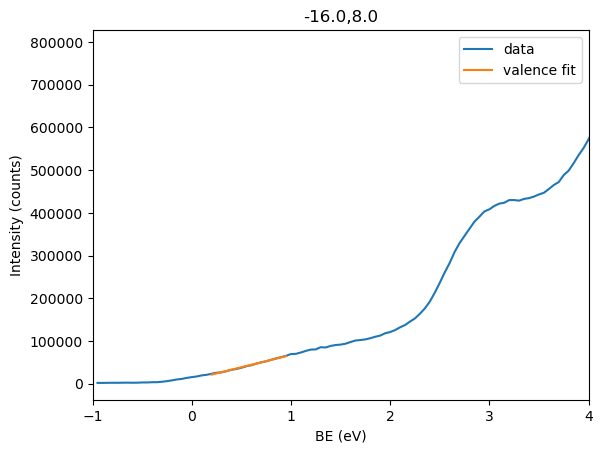

bkg_x_intercept:
 -0.16934499911998696


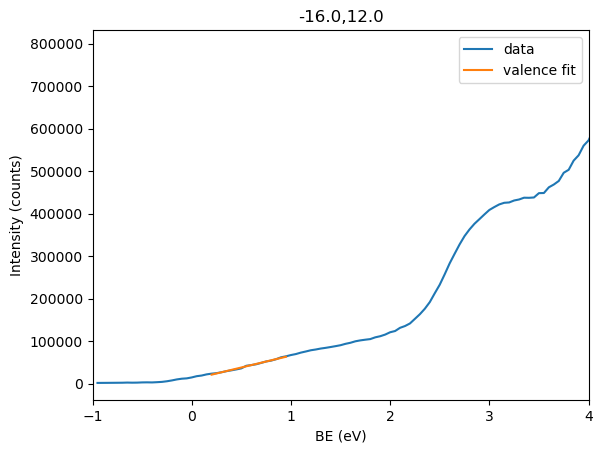

bkg_x_intercept:
 -0.17500143962204862


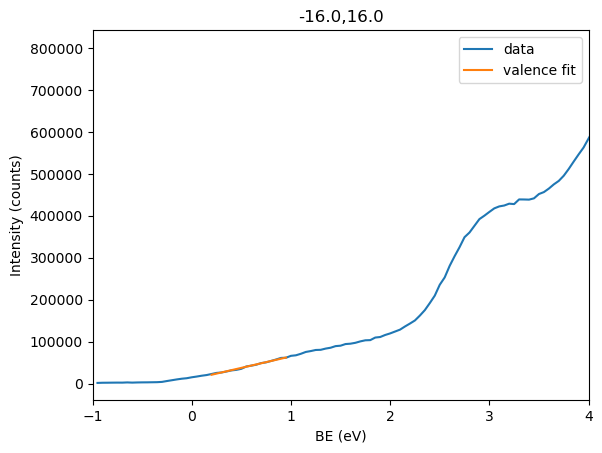

bkg_x_intercept:
 -0.18153579263127045


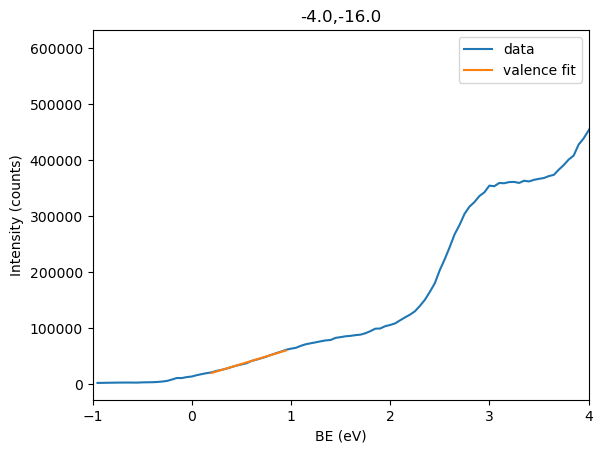

bkg_x_intercept:
 -0.164357527496252


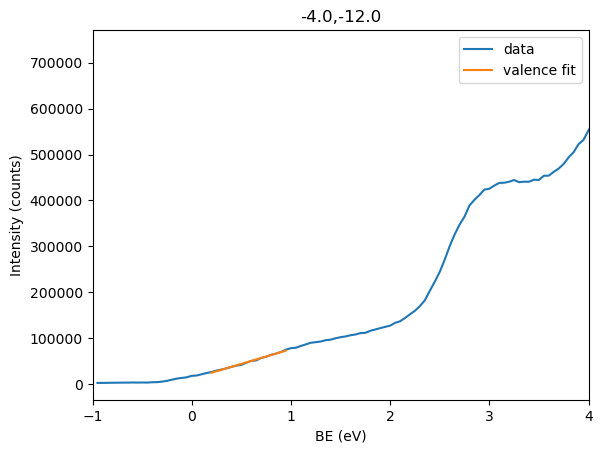

bkg_x_intercept:
 -0.18156406728866292


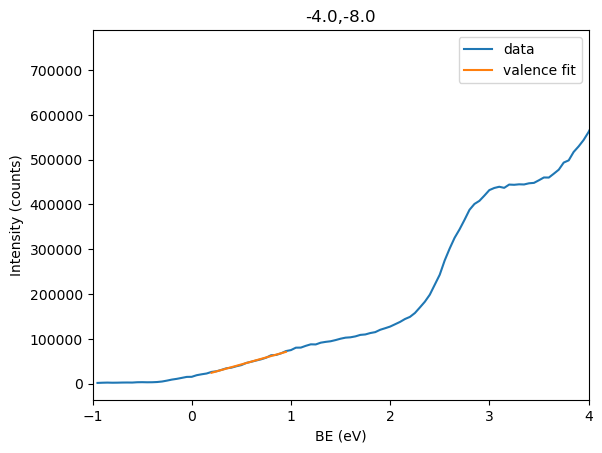

bkg_x_intercept:
 -0.19367909146555576


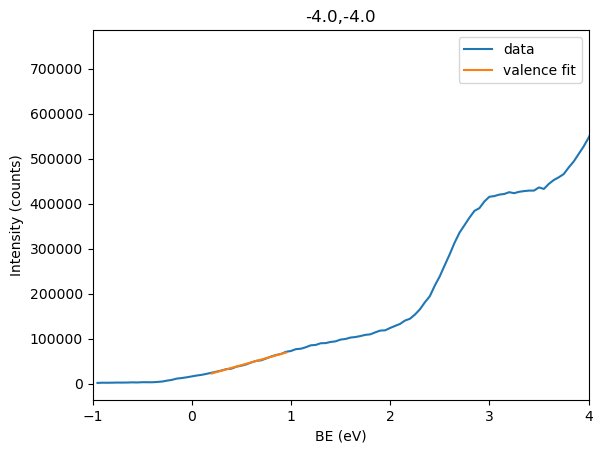

bkg_x_intercept:
 -0.1663908942896585


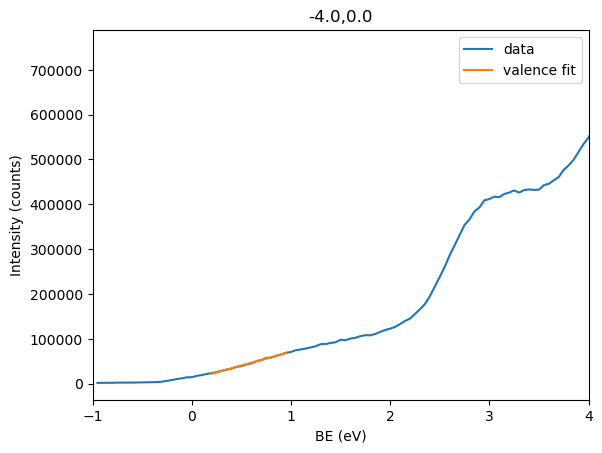

bkg_x_intercept:
 -0.1621607480764405


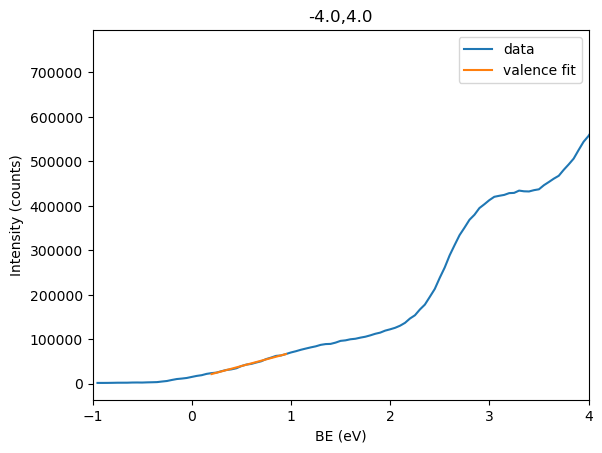

bkg_x_intercept:
 -0.16293076781408378


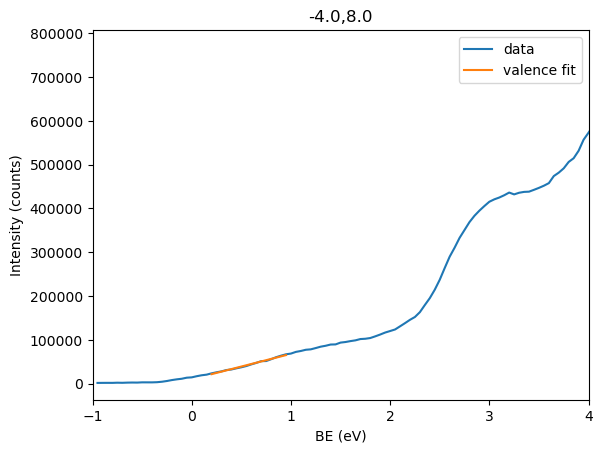

bkg_x_intercept:
 -0.17660996852396538


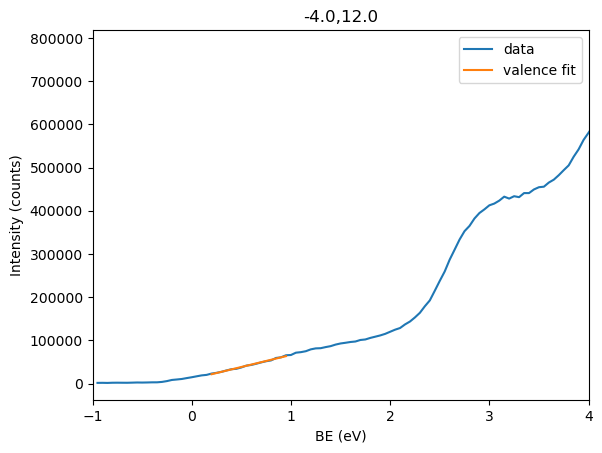

bkg_x_intercept:
 -0.19332225492391328


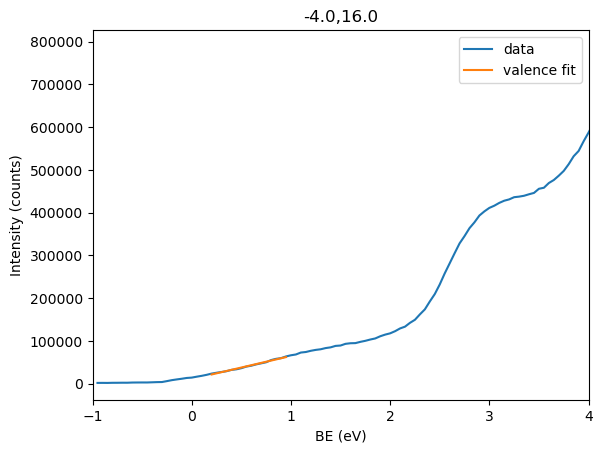

bkg_x_intercept:
 -0.1959400852685773


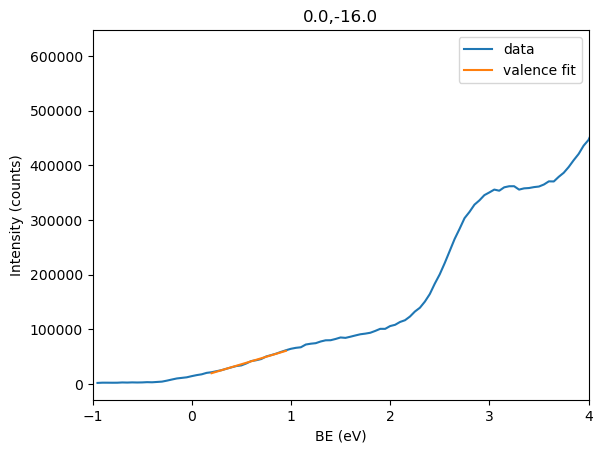

bkg_x_intercept:
 -0.15829223124736783


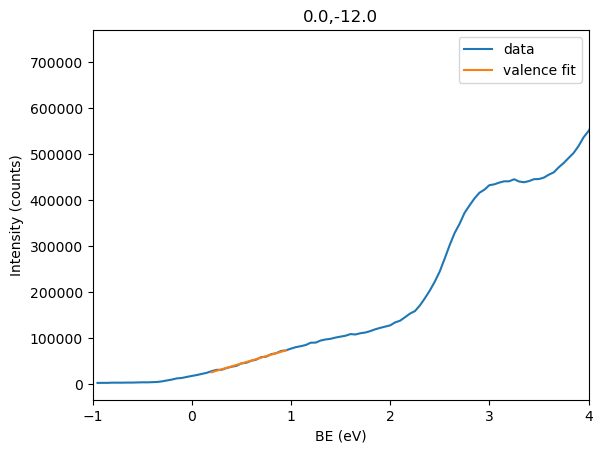

bkg_x_intercept:
 -0.1995205344405618


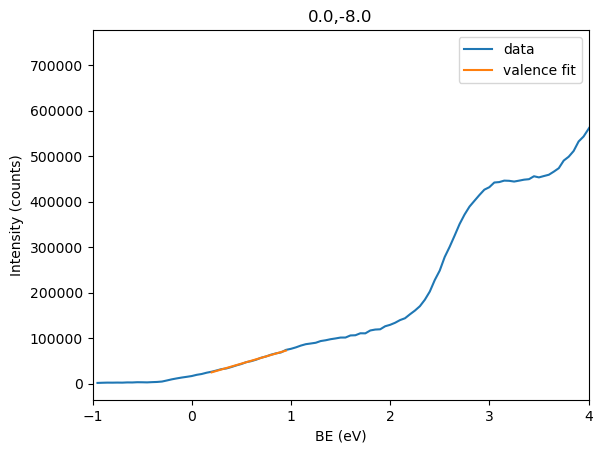

bkg_x_intercept:
 -0.19340177334548828


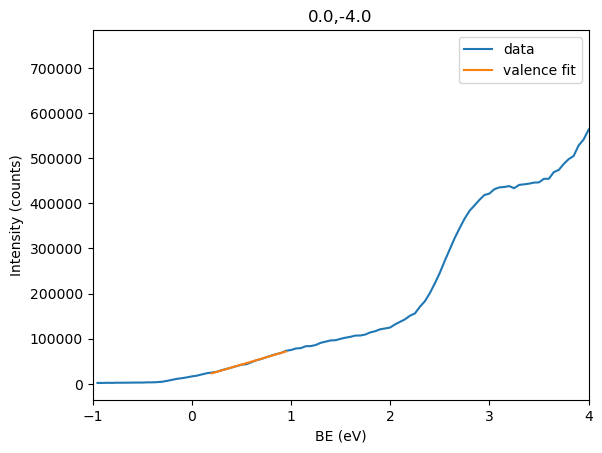

bkg_x_intercept:
 -0.1611319205917437


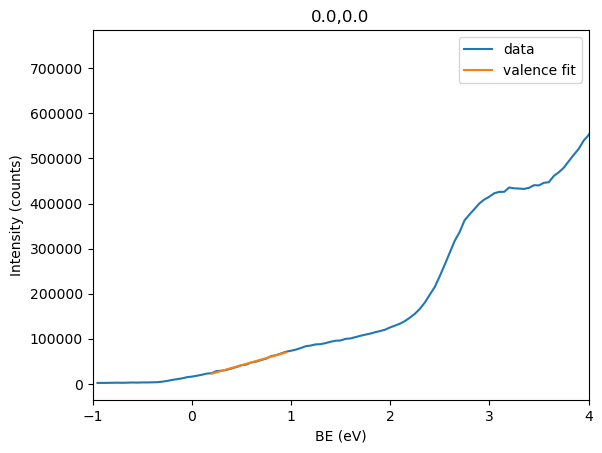

bkg_x_intercept:
 -0.15839502775810801


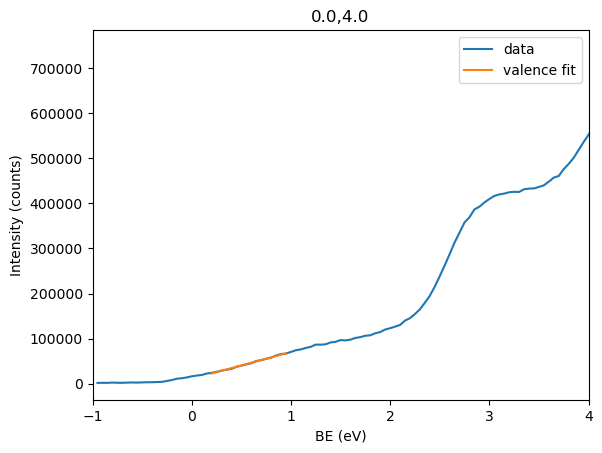

bkg_x_intercept:
 -0.18066794637319625


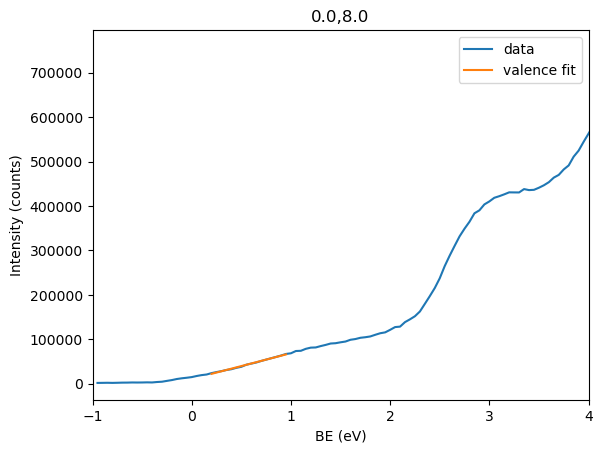

bkg_x_intercept:
 -0.18232627791627815


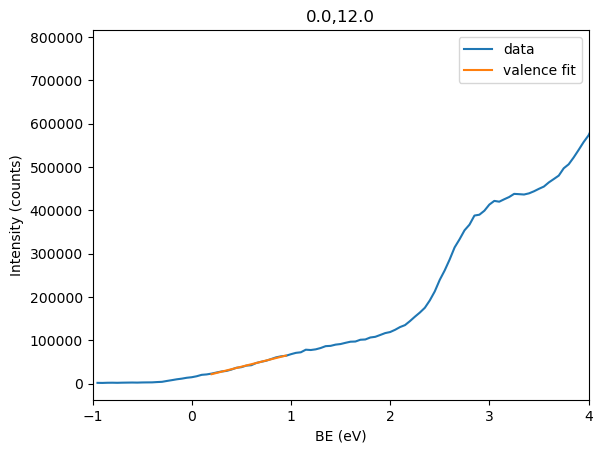

bkg_x_intercept:
 -0.18160607241046617


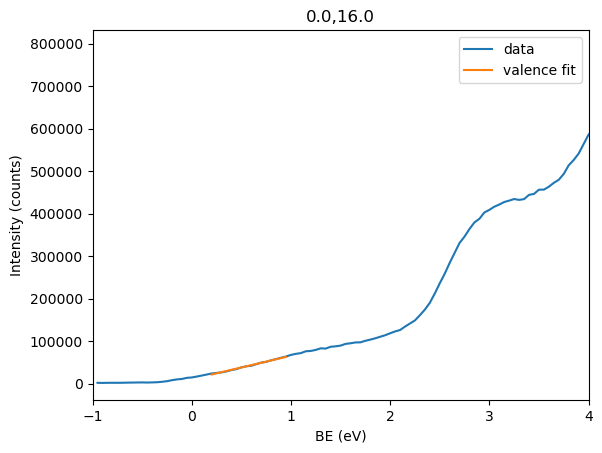

bkg_x_intercept:
 -0.1879612091240022


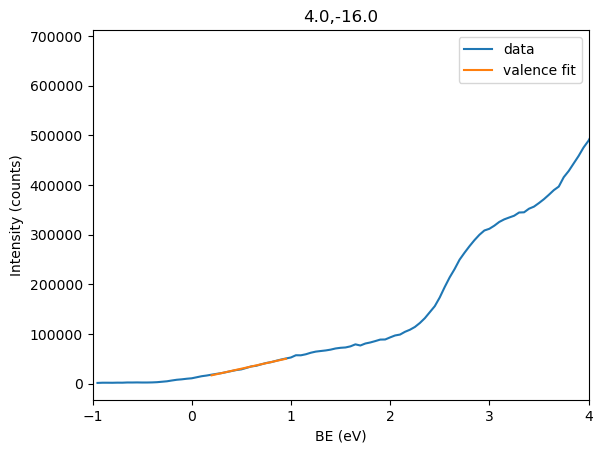

bkg_x_intercept:
 -0.17555313511698212


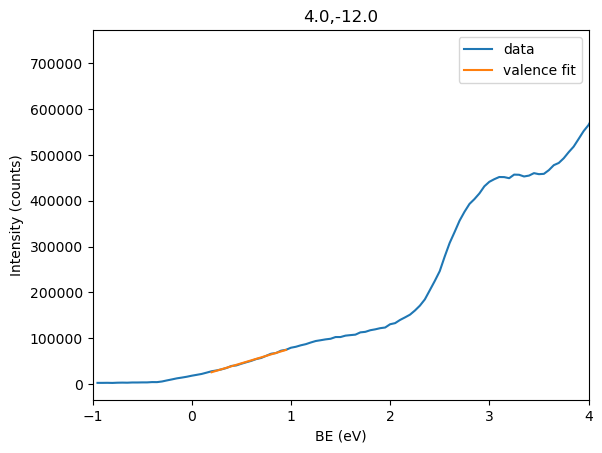

bkg_x_intercept:
 -0.19338058123700613


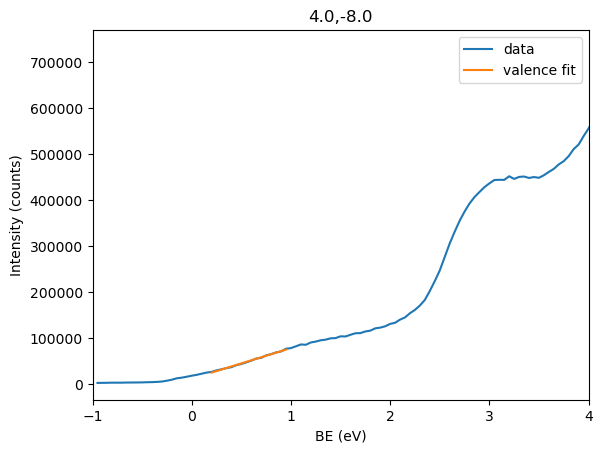

bkg_x_intercept:
 -0.16864528313756644


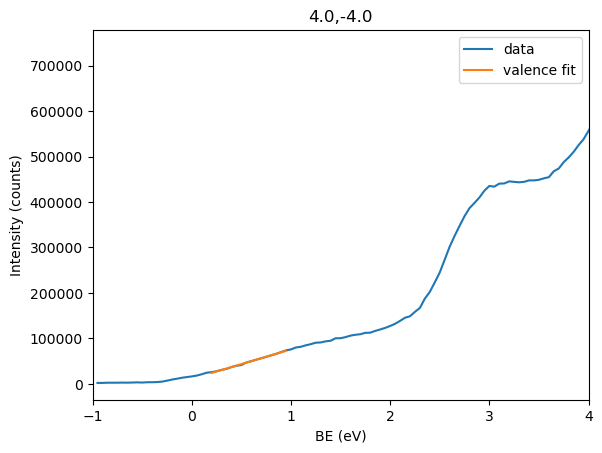

bkg_x_intercept:
 -0.17147539142362905


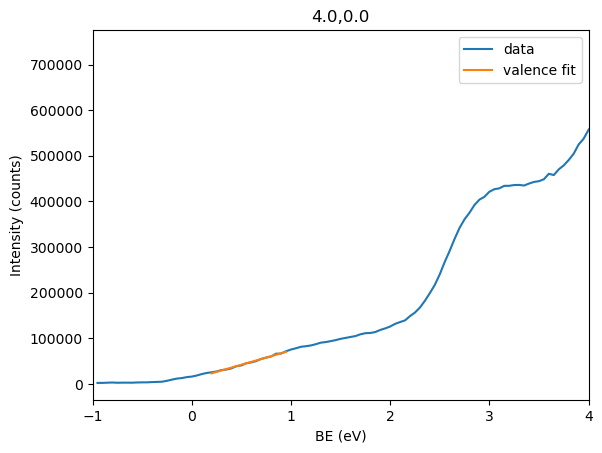

bkg_x_intercept:
 -0.16711448518750888


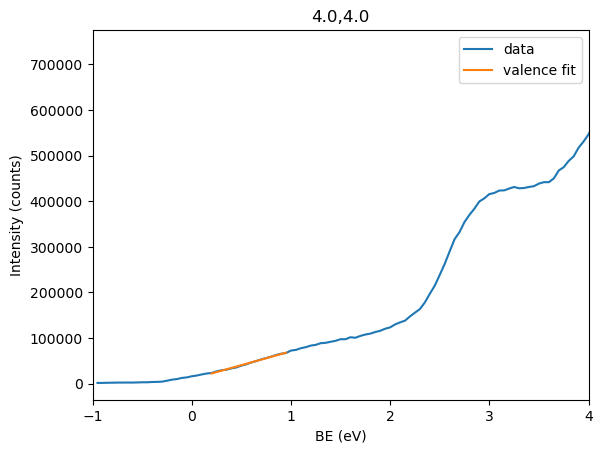

bkg_x_intercept:
 -0.17157077731406567


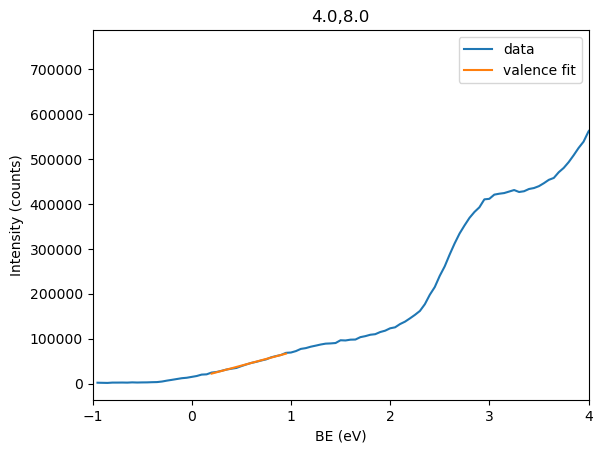

bkg_x_intercept:
 -0.17805235162082983


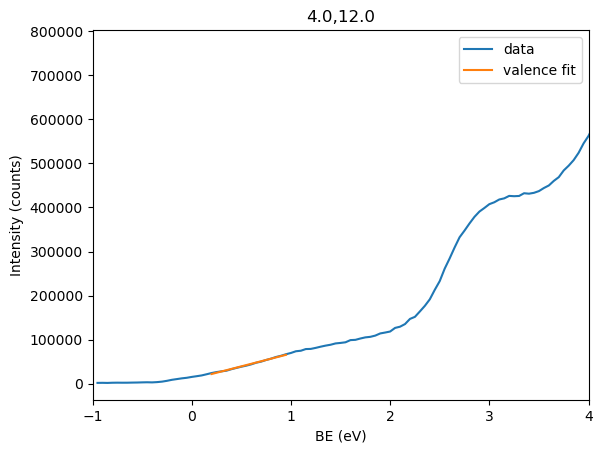

bkg_x_intercept:
 -0.17623475269612712


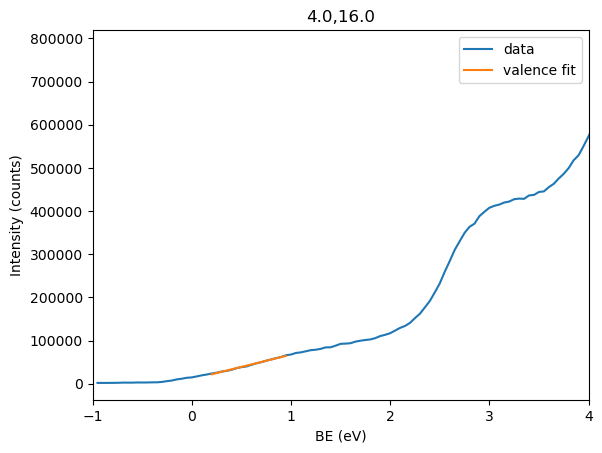

bkg_x_intercept:
 -0.18187330223755474


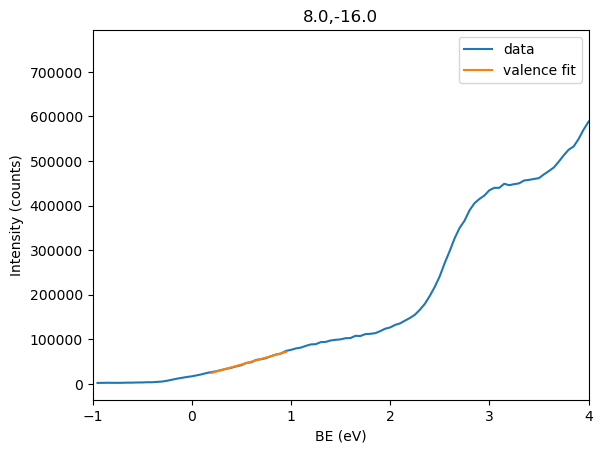

bkg_x_intercept:
 -0.19355342837876108


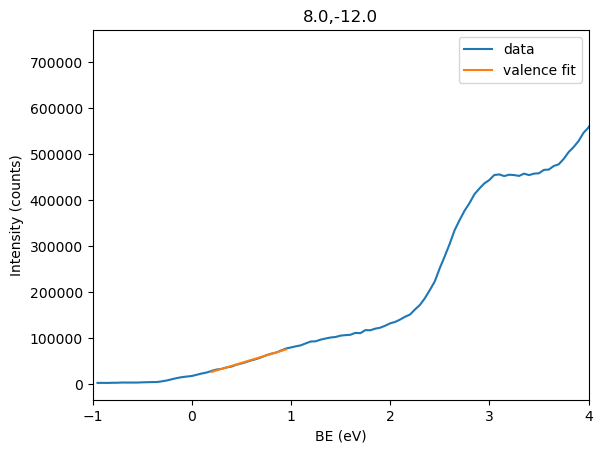

bkg_x_intercept:
 -0.20111970309697064


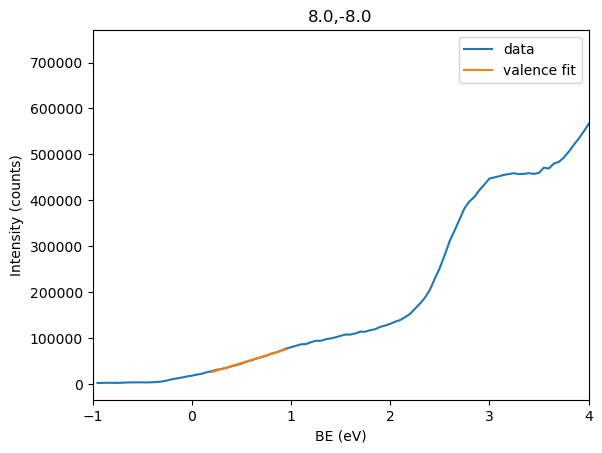

bkg_x_intercept:
 -0.19250063736150214


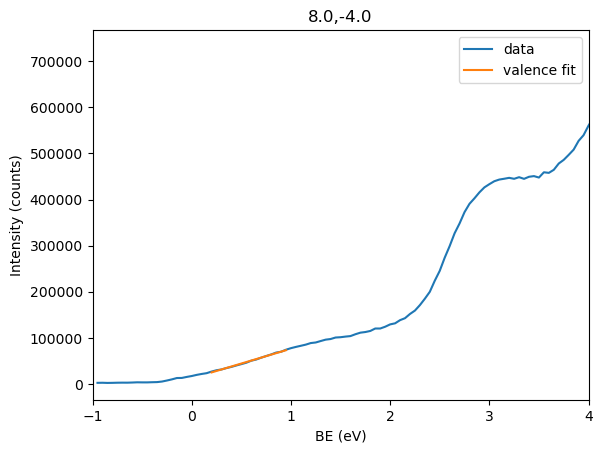

bkg_x_intercept:
 -0.18835468413666984


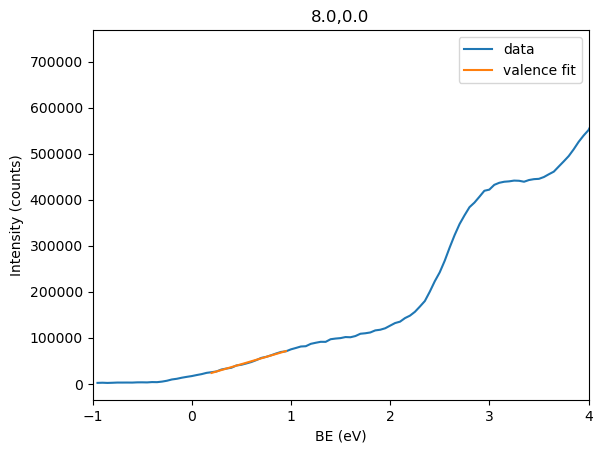

bkg_x_intercept:
 -0.17332886953473073


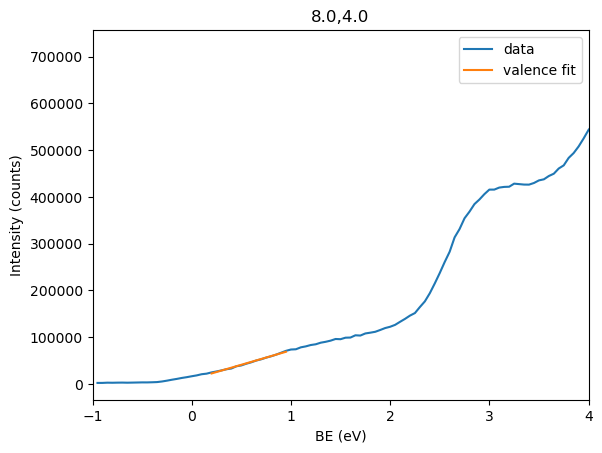

bkg_x_intercept:
 -0.15981046598780538


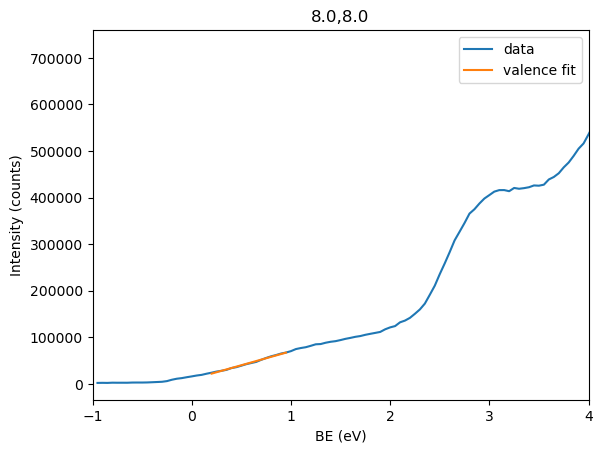

bkg_x_intercept:
 -0.16602309887304997


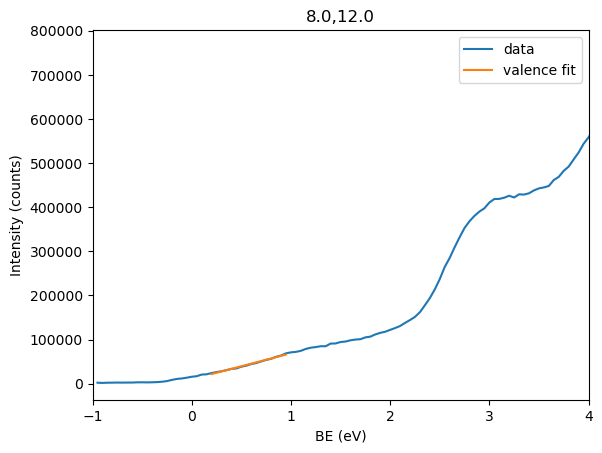

bkg_x_intercept:
 -0.1700574703323001


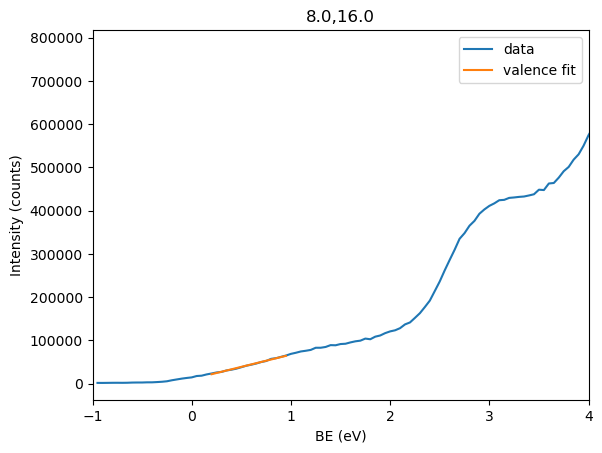

bkg_x_intercept:
 -0.18742817842585274


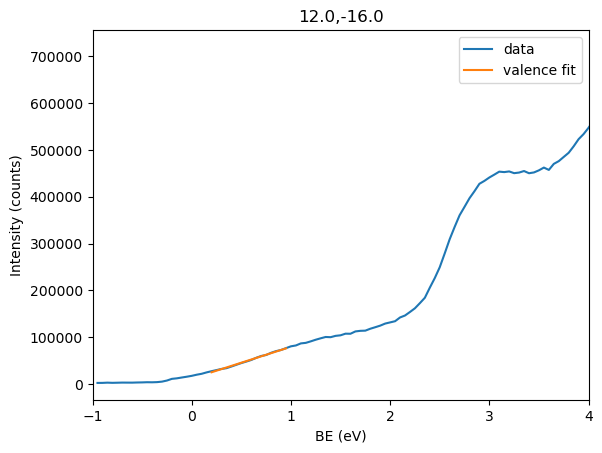

bkg_x_intercept:
 -0.16895339440083565


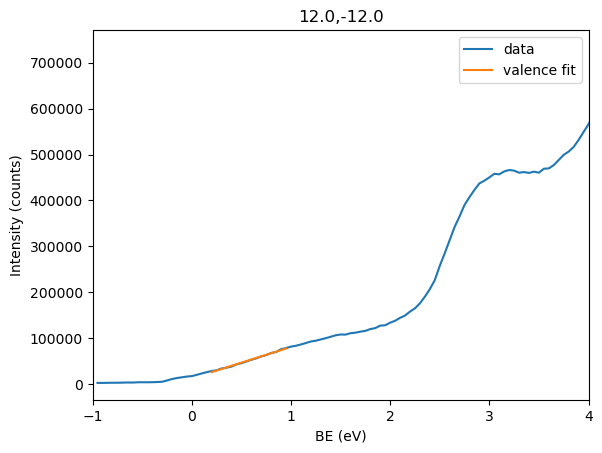

bkg_x_intercept:
 -0.17624221829473255


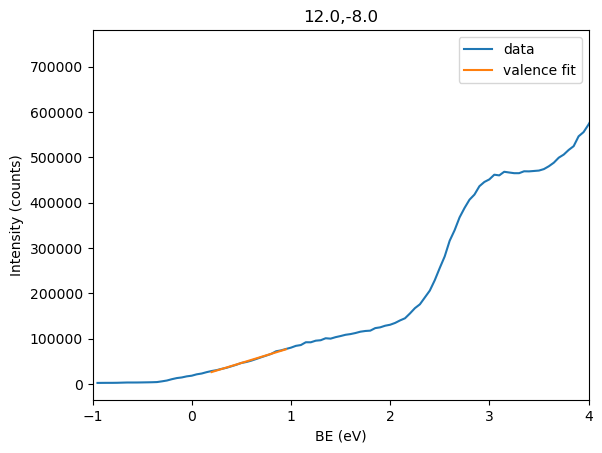

bkg_x_intercept:
 -0.1919822275424175


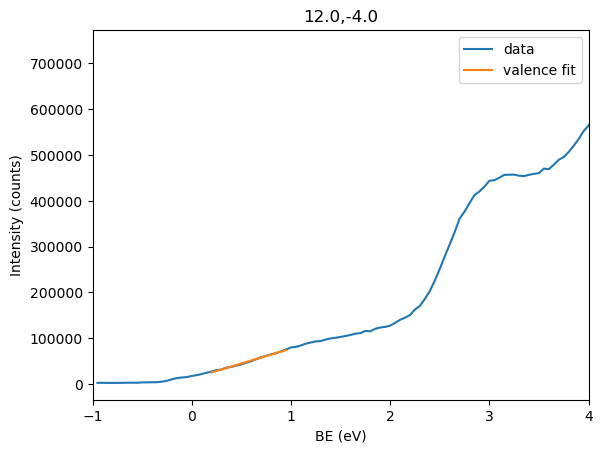

bkg_x_intercept:
 -0.19100175978722422


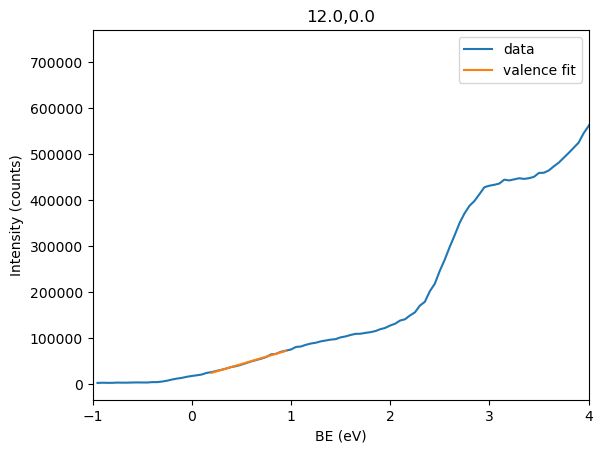

bkg_x_intercept:
 -0.17673758592174257


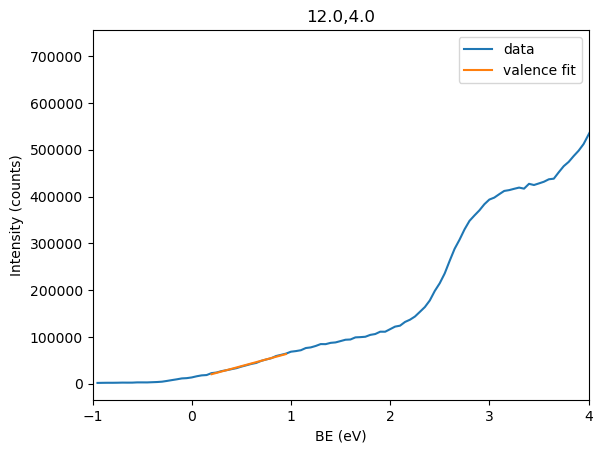

bkg_x_intercept:
 -0.15537497121966604


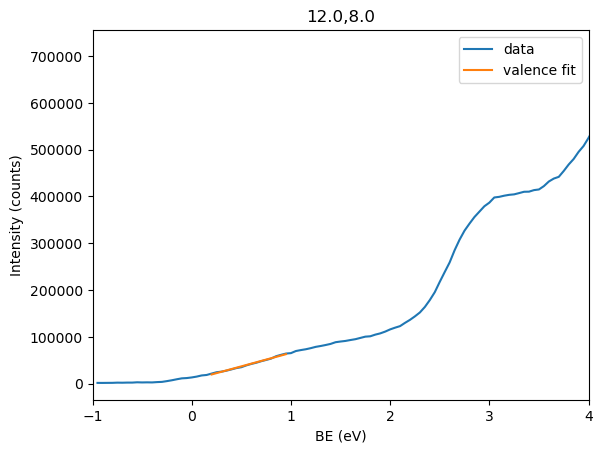

bkg_x_intercept:
 -0.14210315417818134


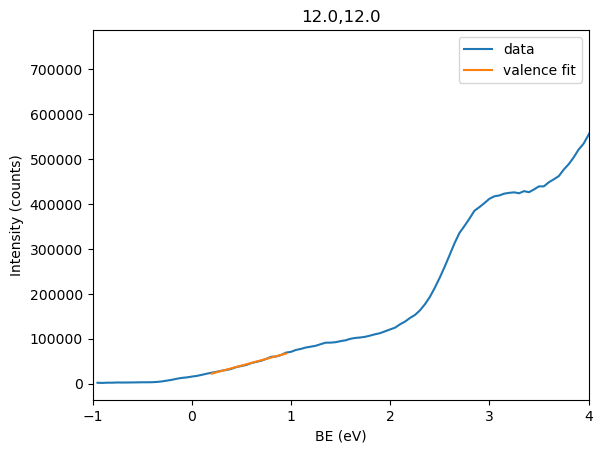

bkg_x_intercept:
 -0.17335444371529854


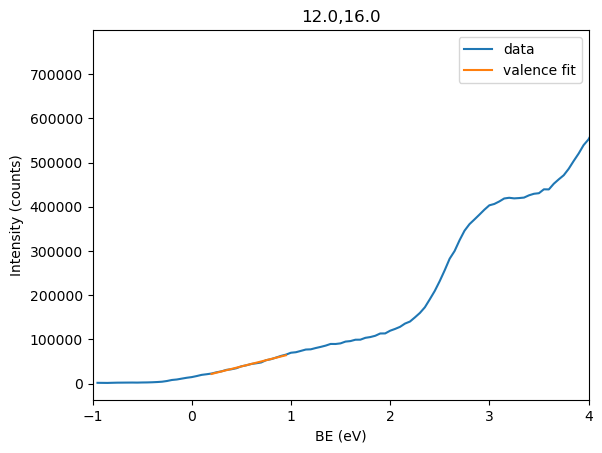

bkg_x_intercept:
 -0.19165634102945697


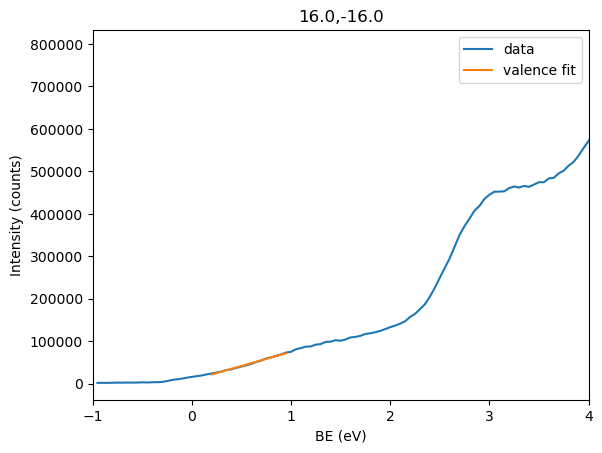

bkg_x_intercept:
 -0.12598766325341848


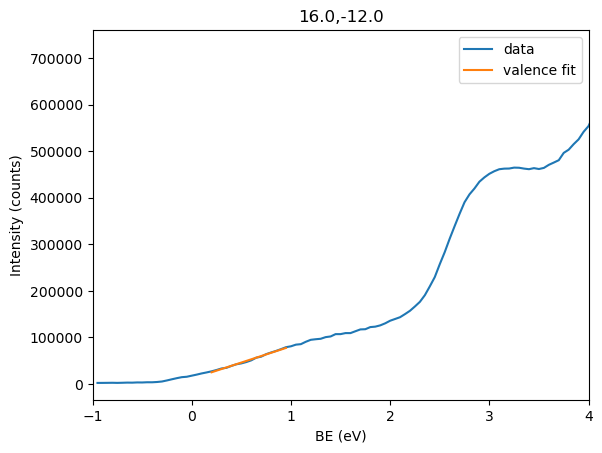

bkg_x_intercept:
 -0.16333421702611495


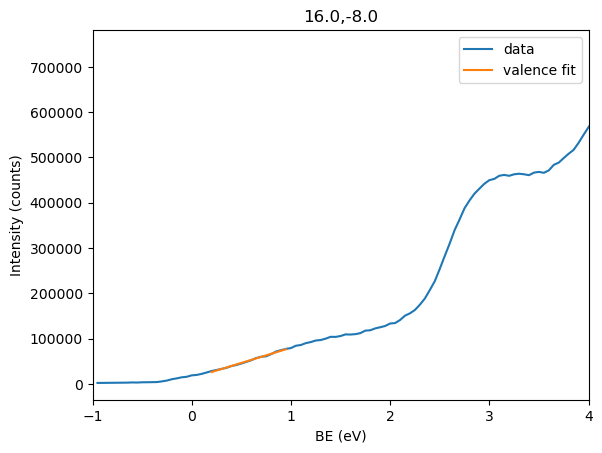

bkg_x_intercept:
 -0.1924798680169126


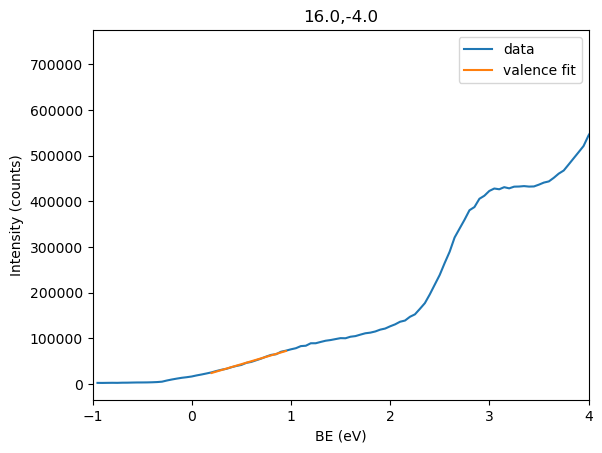

bkg_x_intercept:
 -0.17173079569981048


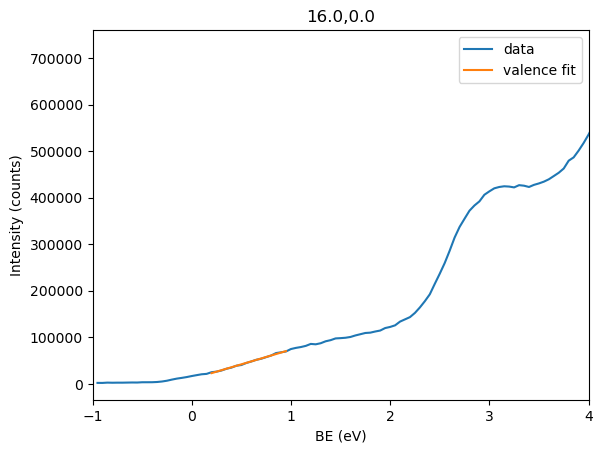

bkg_x_intercept:
 -0.16373810439992592


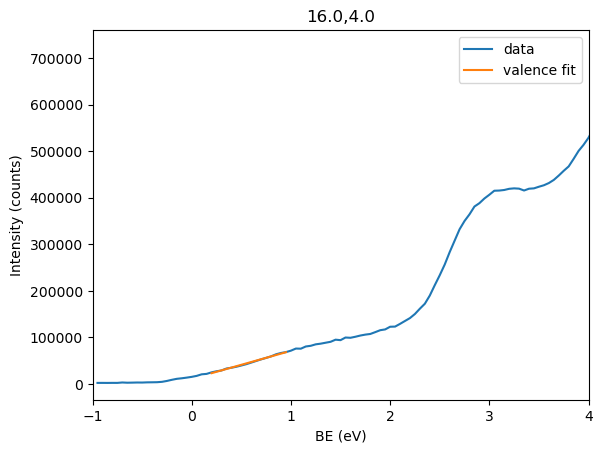

bkg_x_intercept:
 -0.1832528579458295


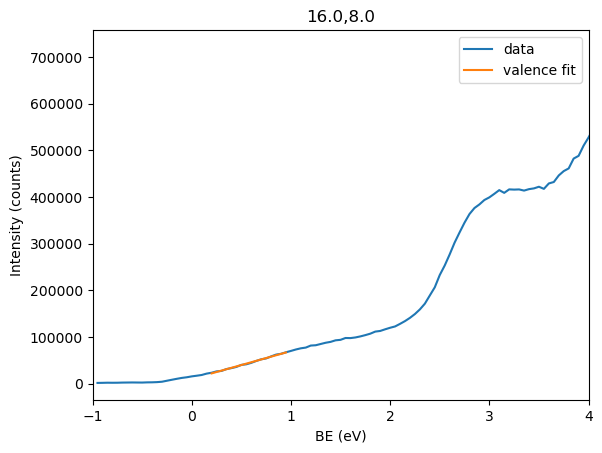

bkg_x_intercept:
 -0.1722503707797505


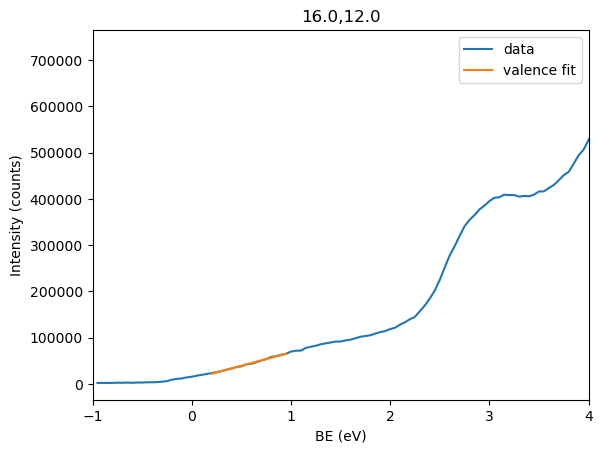

bkg_x_intercept:
 -0.18011699275638116


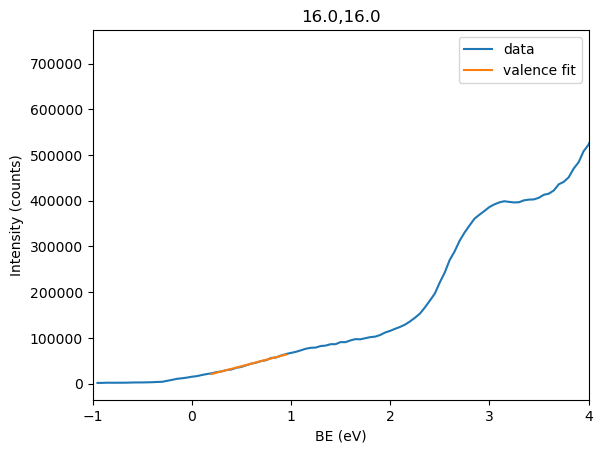

bkg_x_intercept:
 -0.17214916409906972


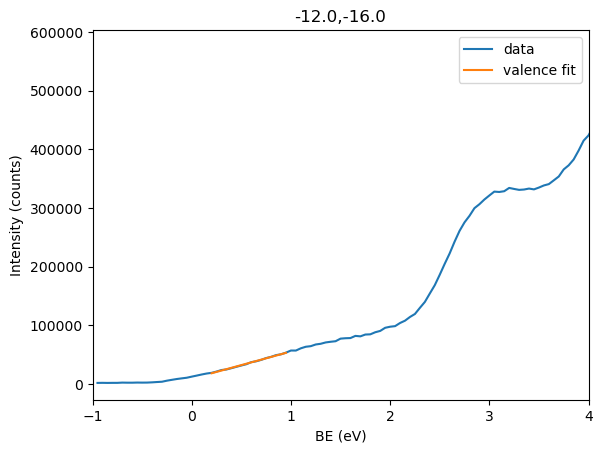

bkg_x_intercept:
 -0.19283090509321132


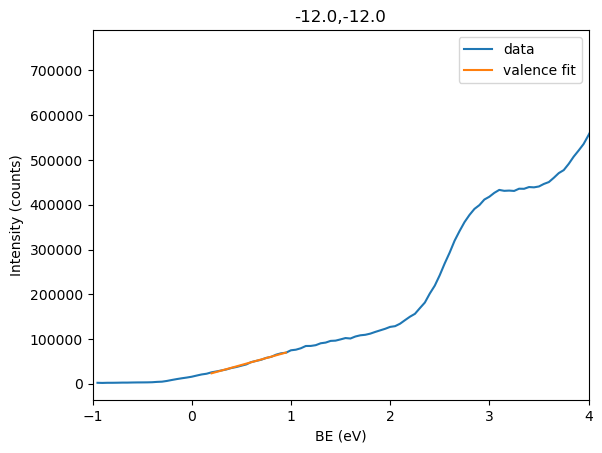

bkg_x_intercept:
 -0.17872025162391053


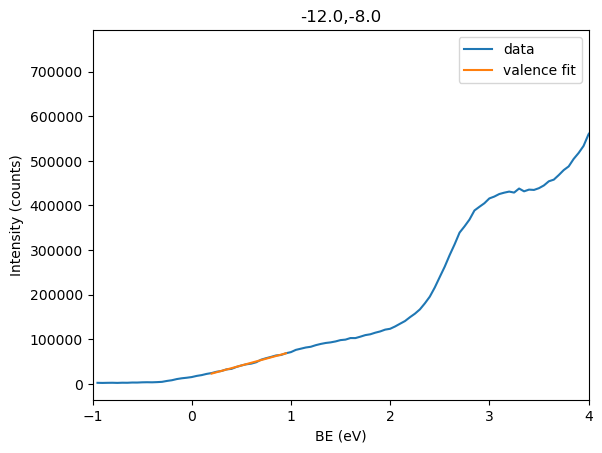

bkg_x_intercept:
 -0.17672244867943593


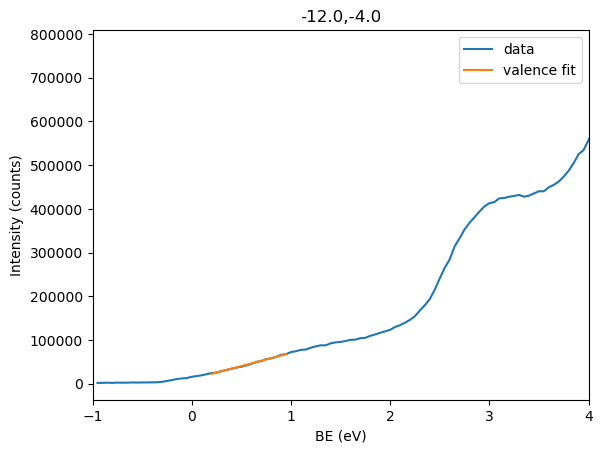

bkg_x_intercept:
 -0.17550947759149726


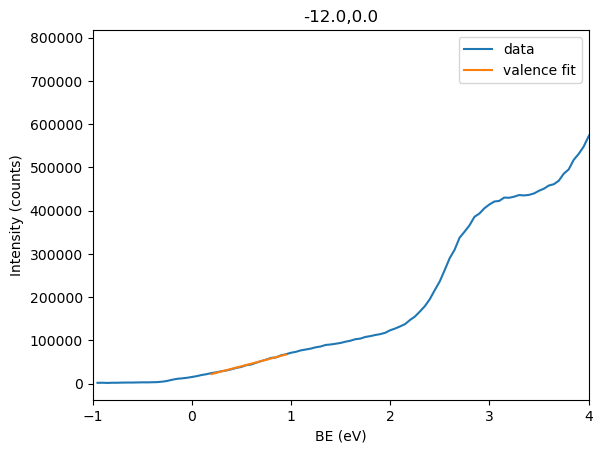

bkg_x_intercept:
 -0.16895195388448844


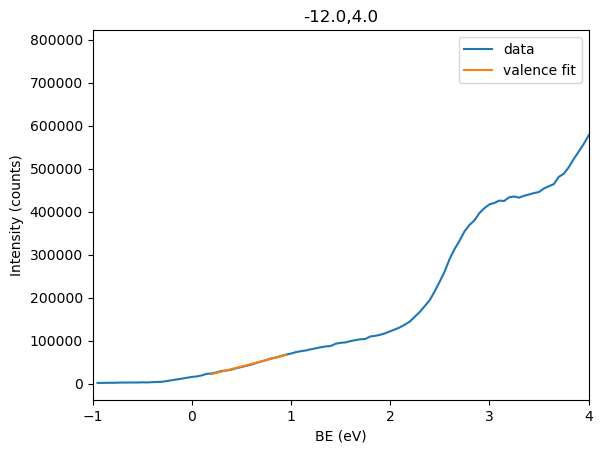

bkg_x_intercept:
 -0.16921166919475508


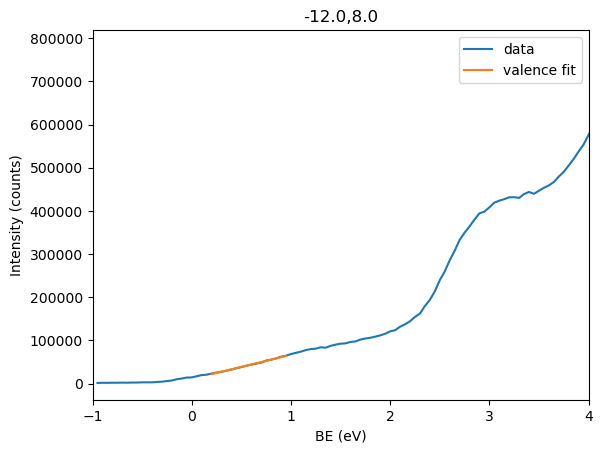

bkg_x_intercept:
 -0.19056880573056223


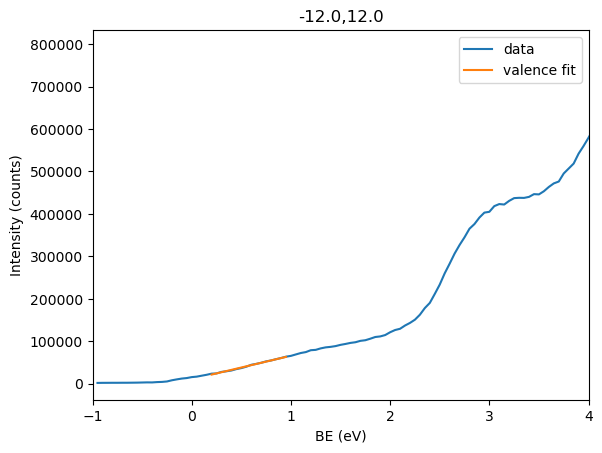

bkg_x_intercept:
 -0.18558902134688895


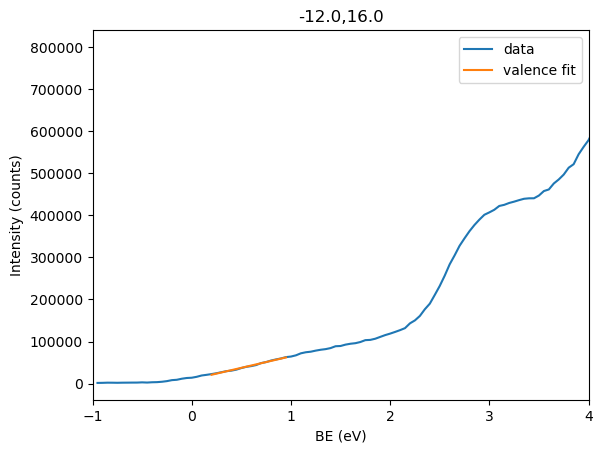

bkg_x_intercept:
 -0.18088104006430658


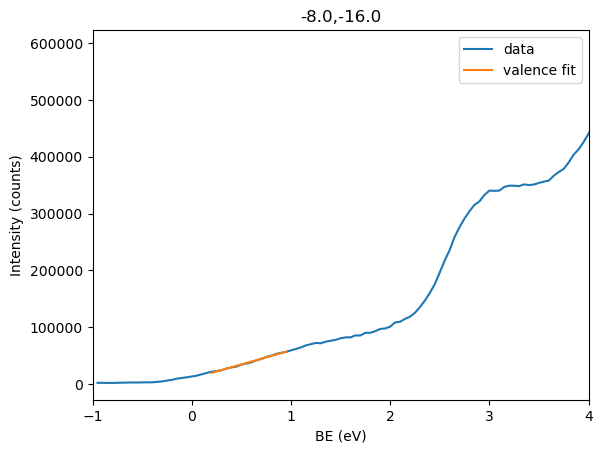

bkg_x_intercept:
 -0.1956635740589239


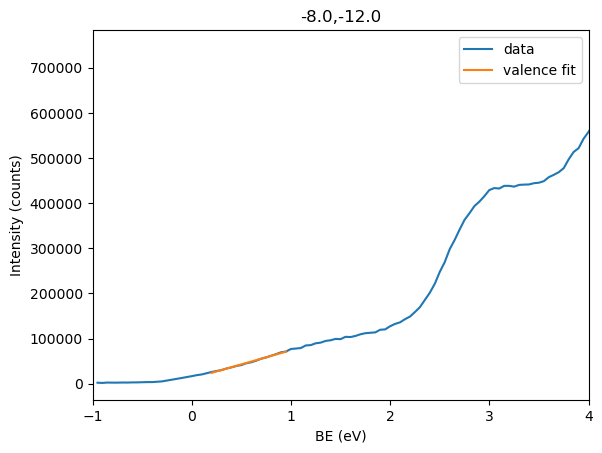

bkg_x_intercept:
 -0.18344665009772498


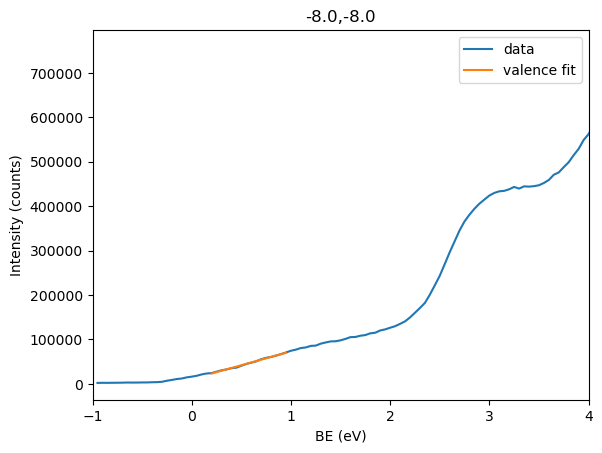

bkg_x_intercept:
 -0.17208147709330163


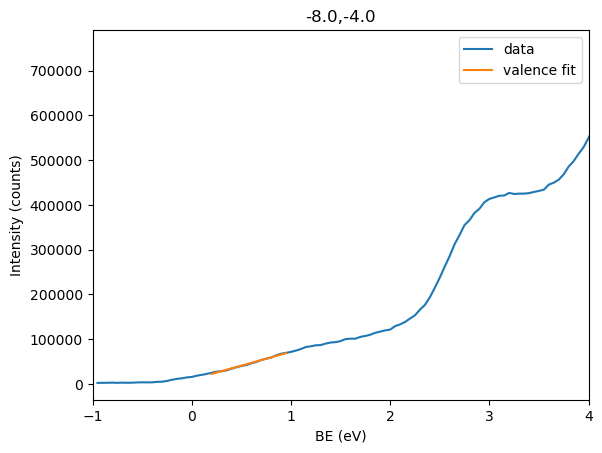

bkg_x_intercept:
 -0.15645979376892424


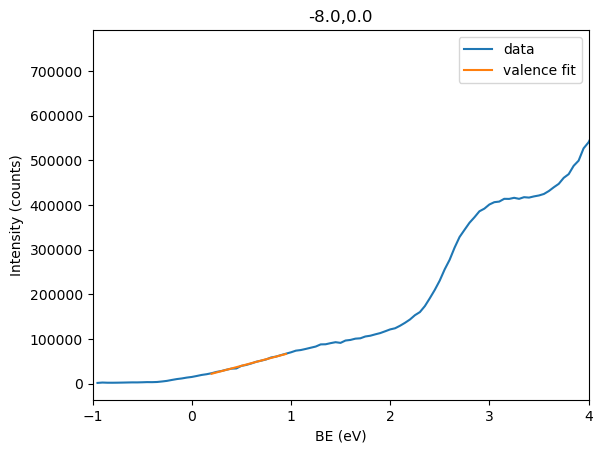

bkg_x_intercept:
 -0.173036543454981


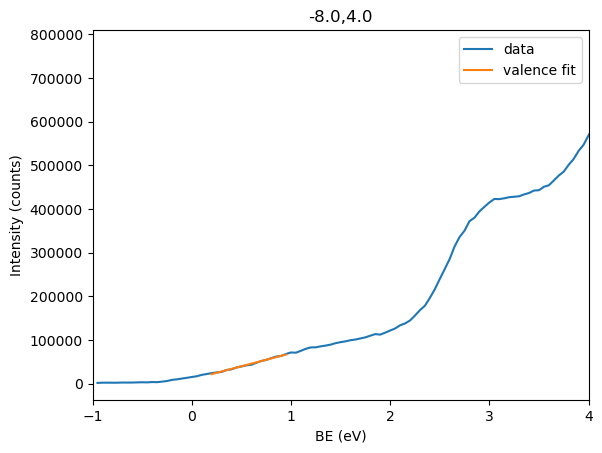

bkg_x_intercept:
 -0.16370058989095454


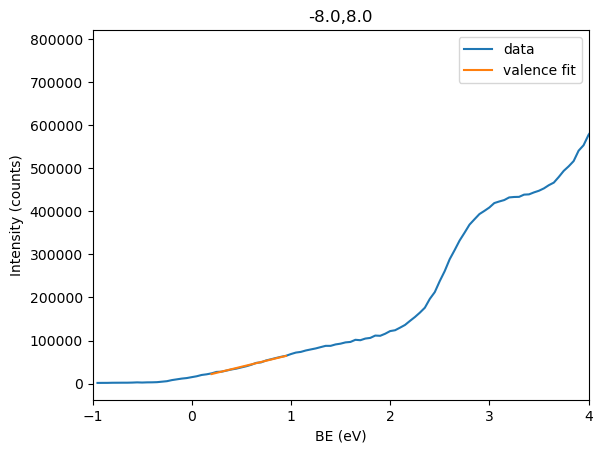

bkg_x_intercept:
 -0.19675599867686563


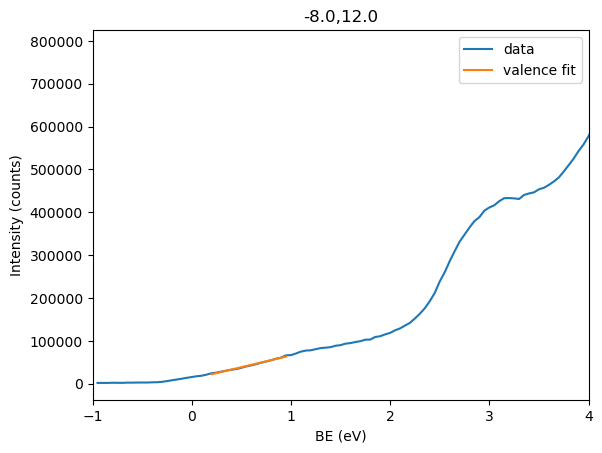

bkg_x_intercept:
 -0.20047322000490847


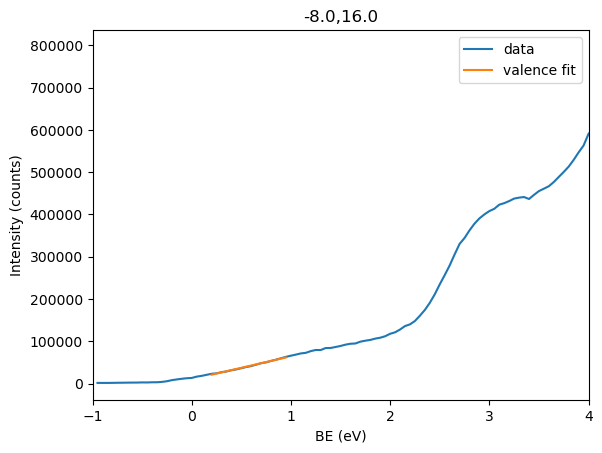

bkg_x_intercept:
 -0.18826602510578042


In [95]:
startvalue= 20
guess= 2000
slope_change= 0.8
window= 3
end= 1
ups_out= UPS_fit(adjusted_data,startvalue, guess_slope= guess, slope_change=slope_change,window=window, background_end=end,
fit_background = False, withplots = True,plotscale = 'linear')

In [96]:
display(ups_out)
# correct_out= rotate_coordinates(ups_out, how='clockwise')


Coordinate,"-16.0,-16.0","-16.0,-12.0","-16.0,-8.0","-16.0,-4.0","-16.0,0.0","-16.0,4.0","-16.0,8.0","-16.0,12.0","-16.0,16.0","-4.0,-16.0",...,"-12.0,16.0","-8.0,-16.0","-8.0,-12.0","-8.0,-8.0","-8.0,-4.0","-8.0,0.0","-8.0,4.0","-8.0,8.0","-8.0,12.0","-8.0,16.0"
Data type,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,...,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept,bkg_x_intercept
0,-0.19286,-0.167507,-0.173441,-0.162709,-0.155899,-0.181305,-0.169345,-0.175001,-0.181536,-0.164358,...,-0.180881,-0.195664,-0.183447,-0.172081,-0.15646,-0.173037,-0.163701,-0.196756,-0.200473,-0.188266


In [98]:
# heatmap(ups_out, datatype= 'bkg_x_intercept')
savepath= os.path.join(file_path, f'{sample}_UPS_onset_x_intercept.png')
new_heatmap(datatype= 'bkg_x_intercept', data=ups_out, title = 'UPS valence band onset', cbar= 'onset (eV)',
                #  exclude=['16.0,16.0'],  # if you want to exclude some point
                savepath= savepath # if you want to save the plots
                )